In [1]:
#CELL #1: IMPORT LIBRARIES AND COUNT IMAGES

import os
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from collections import deque

basedir = 'vehicles/'
image_types = os.listdir(basedir)
cars = []

for imtype in image_types:
    cars.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of Vehicle Images found:', len(cars))
with open('cars.txt', 'w') as f:
    for fn in cars:
        f.write(fn+'\n')

basedir = 'non-vehicles/'
image_types = os.listdir(basedir)
notcars = []

for imtype in image_types:
    notcars.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of Non-Vehicle Images found:', len(notcars))
with open('notcars.txt', 'w') as f:
    for fn in notcars:
        f.write(fn+'\n')
        




Number of Vehicle Images found: 8792
Number of Non-Vehicle Images found: 8968


In [2]:
#CELL #2: DEFINE CORE FUNCTIONS FOR HOG, SPATIAL BINNING, AND COLOR HISTOGRAM FOR EXTRACTING FEATURES

#Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis = False, feature_vec = True):
    #Call with two outputs if vis == True
    if vis == True:
        features, hog_image = hog(img, orientations = orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell), cells_per_block = (cell_per_block, cell_per_block), transform_sqrt = False, visualise = vis, feature_vector = feature_vec)
        
        return features, hog_image
    #Otherwise call with one output
    else:
        features = hog(img, orientations = orient, pixels_per_cell = (pix_per_cell, pix_per_cell), cells_per_block = (cell_per_block, cell_per_block), transform_sqrt = False, visualise = vis, feature_vector = feature_vec)
        return features
    
#Define a function to computer binned color features
def bin_spatial(img, size=(32,32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

#Define a function to computer color histogram features
#NEED TO CHANGE bins_range if reading .png files with mpimg!
#I opted to get rid of bin range altogether and let it be automatic
def color_hist(img, nbins = 32): #bins_range = (0, 256)
    #Computer the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins = nbins)
    channel2_hist = np.histogram(img[:,:,1], bins = nbins)
    channel3_hist = np.histogram(img[:,:,2], bins = nbins)
    #Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    #Return the individual histograms, bin_centers and feature vector
    return hist_features
#Define a function to extract features from a list of images
#Have this function call bin_spatial() and color_hist()
def extract_features(img, color_space='RGB', spatial_size=(32, 32), 
                     hist_bins = 32, orient = 9,
                     pix_per_cell = 8, cell_per_block = 2, hog_channel = 0,
                     spatial_feat = True, hist_feat = True, hog_feat = True):
    #Create a list to append feature vectors to
    features = []
    #Iterate through the list of images
    for file in img:
        file_features = []
        #Read in each one by one
        image = mpimg.imread(file)
        #Apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space =='LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)
        
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            #Apply color_hist()
            hist_features = color_hist(feature_image, nbins = hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        #Call get_hog_features() with vis = False, feature_vec = True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel],
                                                        orient, pix_per_cell, cell_per_block,
                                                        vis = False, feature_vec = True))
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient,
                                               pix_per_cell, cell_per_block, vis = False, feature_vec = True)
            #Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    #Return list of feature vectors
    return features




In [3]:
#CELL#3: WINDOW SLIDING FUNCTION, BOX DRAWING, AND SINGLE IMAGE FEATURE EXTRACTOR
#Define a WINDOW SLIDING function that takes an image,
#start and stop positions in both x and y,
#window size (x and y dimensions),
#and overlap fraction(for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None],
                xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    
    #Compute the span of the region to be searched
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    
    #Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    
    #Compute the number of windows in x/y
    nx_windows = np.int(xspan/nx_pix_per_step) - 1
    ny_windows = np.int(yspan/ny_pix_per_step) - 1
    
    #Initialize a list to append window positions to
    window_list = []
    #Loop through finding x and y window positions
    #Note: you could vectorize this step, but in practice
    #you'll be considering windows one by one with your 
    #classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            #Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            #Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

#Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color = (0,0,255), thick = 6):
    #Make a copy of the image
    imcopy = np.copy(img)
    #Iterate through the bounding boxes
    for bbox in bboxes:
        #Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    #Return the image copy with boxes drawn
    return imcopy

#Define a function to extract features from a singleimage window
#This function is very similar to extract_features()
#just for a single image rather than list of images
def single_img_features(image, color_space='RGB', spatial_size = (32, 32),
                      hist_bins = 32, orient = 9,
                      pix_per_cell = 8, cell_per_block = 2, hog_channel = 0,
                       spatial_feat = True, hist_feat = True, hog_feat = True, vis = False):
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space =='LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image)
    
    #3)Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size = spatial_size)
        #4)Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins = hist_bins)
        #6)Append features to list
        img_features.append(hist_features)
    #7)Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel],
                                                    orient, pix_per_cell, cell_per_block,
                                                    vis=False, feature_vec=True))
            hog_features = np.concatenate(hog_features)

            
            
            
            
            
            
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient,
                                                          pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient,
                                              pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)
    #9) Return concatenated array of features
    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)
    
    

In [4]:
#CELL#4: WINDOW SEARCHING AND VISUALIZATION 
#Define a function you will pass an image
#and the list of windows to be searched(output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB',
                  spatial_size=(32, 32), hist_bins=32,
                  hist_range=(0,256), orient=9,
                  pix_per_cell=8, cell_per_block=2,
                  hog_channel=0, spatial_feat=True,
                  hist_feat=True, hog_feat=True):
    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from the original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #print('features shape is',np.asarray(features).shape)
        #print('features is',features)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

#Define a function for displaying multiple images
def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])

C:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)
C:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


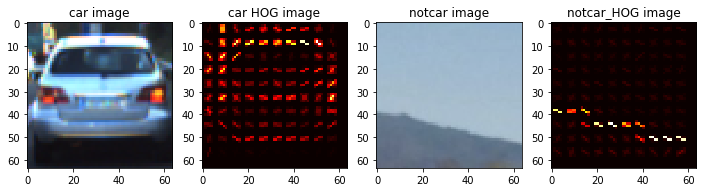

In [5]:
#CELL #5: EXAMPLE IMAGES OF HOG FEATURE EXTRACTION AND HEATMAPS
%matplotlib inline

#Choose Random car / not-car indies
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

#Read in car/not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

#Define feature parameters
color_space = 'RGB' #Could be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 6
pix_per_cell = 6
cell_per_block = 2
hog_channel = 0 # Can be 0, 1, 2, or "all"
spatial_size = (16, 16) #Spatial binning dimensions
hist_bins = 16 #Num of histogram bins
spatial_feat = True #Spatial features on or off
hist_feat = True #Histogram features on or off
hog_feat = True #HOG features on or off

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                                                 hist_bins=hist_bins, orient = orient, pix_per_cell=pix_per_cell,
                                                 cell_per_block=cell_per_block, hog_channel=hog_channel, 
                                                spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat,
                                                 vis = True)
notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size,
                                                 hist_bins=hist_bins, orient = orient, pix_per_cell=pix_per_cell,
                                                 cell_per_block=cell_per_block, hog_channel=hog_channel, 
                                                spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat,
                                                 vis = True)

images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car image', 'car HOG image', 'notcar image', 'notcar_HOG image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)


In [6]:
#CELL #6: TRAINING SVC
### Define feature parameters
color_space = 'YCrCb' #Could be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 6
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "all"
spatial_size = (32, 32) #Spatial binning dimensions
hist_bins = 32 #Num of histogram bins
spatial_feat = True #Spatial features on or off
hist_feat = True #Histogram features on or off
hog_feat = True #HOG features on or off

t=time.time()
n_samples = 1000
random_idxs = np.random.randint(0, len(cars), n_samples)
test_cars = cars#np.array(cars)[random_idxs]
test_notcars = notcars#np.array(notcars)[random_idxs] 

car_features = extract_features(test_cars, color_space=color_space, spatial_size=spatial_size,
                                                 hist_bins=hist_bins, orient = orient, pix_per_cell=pix_per_cell,
                                                 cell_per_block=cell_per_block, hog_channel=hog_channel, 
                                                spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(test_notcars, color_space=color_space, spatial_size=spatial_size,
                                                 hist_bins=hist_bins, orient = orient, pix_per_cell=pix_per_cell,
                                                 cell_per_block=cell_per_block, hog_channel=hog_channel, 
                                                spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)

print(time.time() - t, 'sec to compute features')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
#Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
#Apply the scaler to X
scaled_X = X_scaler.transform(X)

#Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

#Split up data into randomized training and test sets
rand_state = np.random.randint(0,100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size = 0.1, random_state = rand_state)

print('Using:', orient, 'orientations,', pix_per_cell,
     'pixels per cell,', cell_per_block, 'cells per block,',
     hist_bins, 'histogram bins, and', spatial_size,'spatial sampling')
print('Feature vector length:', len(X_train[0]))

#Use a linear SVC
svc = LinearSVC()

#Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train SVC...')
#Check the score fo the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

C:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)
C:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


107.03348231315613 sec to compute features
Using: 9 orientations, 6 pixels per cell, 2 cells per block, 32 histogram bins, and (32, 32) spatial sampling
Feature vector length: 11916
88.41 Seconds to train SVC...
Test Accuracy of SVC =  0.9927


0.0 1.0


C:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)
C:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


1.964224100112915 seconds to process one image searching 160 windows
0.0 1.0
0.6518044471740723 seconds to process one image searching 160 windows
0.0 1.0
0.6554038524627686 seconds to process one image searching 160 windows
0.0 1.0
0.6300101280212402 seconds to process one image searching 160 windows
0.0 1.0
0.6490023136138916 seconds to process one image searching 160 windows
0.0 1.0
0.6330018043518066 seconds to process one image searching 160 windows
0.0 1.0
0.6344025135040283 seconds to process one image searching 160 windows
0.0 1.0
0.6320013999938965 seconds to process one image searching 160 windows


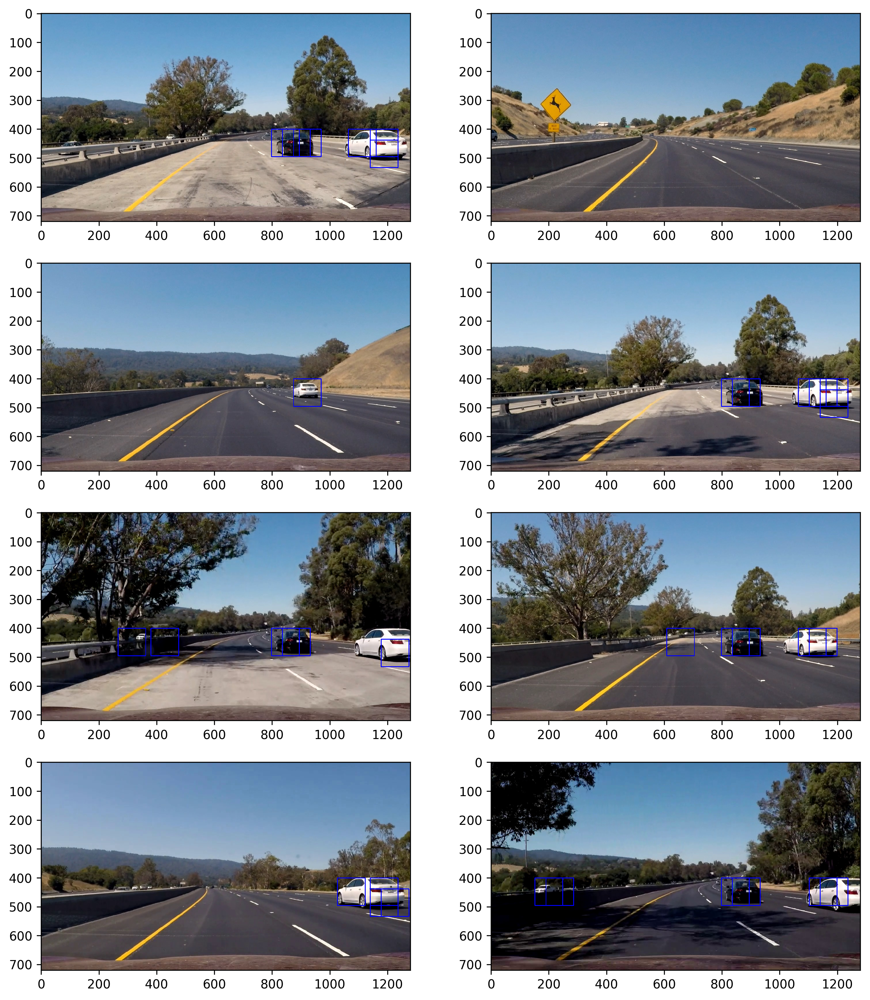

In [7]:
#CELL #7: CREATING LISTS OF WINDOWS AND CHECKING THEM FOR CARS
searchpath = 'test_images/*'
example_images = glob.glob(searchpath)
images = []
titles = []
y_start_stop = [400, 656] #Min and max in y to search in slide_window()
overlap = 0.6
for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    print(np.min(img), np.max(img))
    
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop = y_start_stop, 
                           xy_window = [96,96], xy_overlap = (overlap,overlap))
    hot_windows = search_windows(img, windows, svc, X_scaler, color_space = color_space,
                                spatial_size = spatial_size, hist_bins = hist_bins,
                                orient = orient, pix_per_cell = pix_per_cell,
                                cell_per_block = cell_per_block,
                                hog_channel = hog_channel, spatial_feat = spatial_feat,
                                hist_feat = hist_feat, hog_feat = hog_feat)
    
    window_img = draw_boxes(draw_img, hot_windows, color = (0,0,255), thick=2)
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')
fig = plt.figure(figsize = (12,18), dpi = 300)
visualize(fig, 5, 2, images, titles)

In [8]:
#CELL #8: COLOR CONVERSION
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

C:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)
C:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


2.497840642929077 seconds to run, total windows =  2376
1.9272048473358154 seconds to run, total windows =  2376
1.9474084377288818 seconds to run, total windows =  2376
1.9958078861236572 seconds to run, total windows =  2376
2.914618730545044 seconds to run, total windows =  2376
2.185866355895996 seconds to run, total windows =  2376
1.9310760498046875 seconds to run, total windows =  2376
1.8966038227081299 seconds to run, total windows =  2376


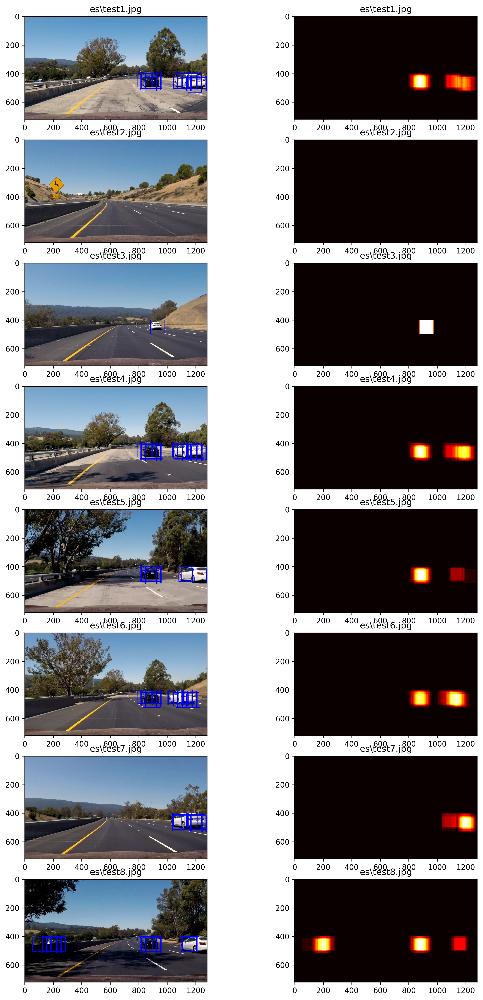

In [9]:
#CELL #9: MODS FOR 3-CHANNEL HOG FEATURES ON EXAMPLE IMAGES AND THEIR HEATMAPS
out_images = []
out_maps = []
out_titles = []
out_boxes = []
#Consider a narrower swath in y
ystart = 400
ystop = 656
scale = 1.5
#Iterate over test images
for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    #Make a heatmap of zeros
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv = 'RGB2YCrCb')
    if scale != 1: 
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    #Define blocks and steps a above
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 1 #Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    #Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec = False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec = False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec = False)

    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            #Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            #Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            #Get color features
            spatial_features = bin_spatial(subimg, size = spatial_size)
            hist_features = color_hist(subimg, nbins = hist_bins)
            
            
            #Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1,-1))
            test_prediction = svc.predict(test_features)
            confidence = svc.decision_function(test_features)
            
            if test_prediction == 1 and abs(confidence) > 0.7:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img, (xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),2)
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
        
    print(time.time()-t,'seconds to run, total windows = ', count)
    
    out_images.append(draw_img)
    
    out_titles.append(img_src[-12:])
    out_titles.append(img_src[-12:])
    
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)
    
fig = plt.figure(figsize=(12,24), dpi = 300)
visualize(fig, 8, 2, out_images, out_titles)
    

In [10]:
print(np.max(np.asarray(out_images[13])))

26


In [11]:
#CELL #10: CLASS FOR HEATMAPS AND FIND_CARS FUNCTION FOR VIDEO
#class AvgHeat:
#    def __init__(self):
#        self.heats = []
#    def add_heat(self, heat):
#        self.heats.append(heat)

def find_cars(img, scale):

    draw_img = np.copy(img)
    #Make a heatmap of zeros
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
    
    boxes = []
    
    for sscale in scale:
    
        img_tosearch = img[ystart:ystop,:,:]
        ctrans_tosearch = convert_color(img_tosearch, conv = 'RGB2YCrCb')

        if sscale != 1: 
            imshape = ctrans_tosearch.shape
            ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/sscale), np.int(imshape[0]/sscale)))

        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]

        #Define blocks and steps a above
        nxblocks = (ch1.shape[1] // pix_per_cell) - 1
        nyblocks = (ch1.shape[0] // pix_per_cell) - 1
        nfeat_per_block = orient*cell_per_block**2
        window = 64
        nblocks_per_window = (window // pix_per_cell) - 1
        cells_per_step = 1 #Instead of overlap, define how many cells to step
        nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
        nysteps = (nyblocks - nblocks_per_window) // cells_per_step

        #Compute individual channel HOG features for the entire image
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec = False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec = False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec = False)

        for xb in range(nxsteps):
            for yb in range(nysteps):
                ypos = yb*cells_per_step
                xpos = xb*cells_per_step
                #Extract HOG for this patch
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

                xleft = xpos*pix_per_cell
                ytop = ypos*pix_per_cell

                #Extract the image patch
                subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))

                #Get color features
                spatial_features = bin_spatial(subimg, size = spatial_size)
                hist_features = color_hist(subimg, nbins = hist_bins)


                #Scale features and make a prediction
                test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1,-1))
                test_prediction = svc.predict(test_features)
                confidence = svc.decision_function(test_features)

                if test_prediction == 1 and abs(confidence) > 1.2:
                    xbox_left = np.int(xleft*sscale)
                    ytop_draw = np.int(ytop*sscale)
                    win_draw = np.int(window*sscale)
                    #cv2.rectangle(draw_img, (xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255))
                    #img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                    boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                    #heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                
                
                

    heat = np.zeros_like(img[:,:,0]).astype(np.float)

    # Add heat for each box in box list
    for box in boxes:
        heat[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Add new heatmap to average heat list
    avgheat.append(heat)
        
    # Keep most recent 9 frames
    #if len(avgheat.heats) > 9:
    #    avgheat.heats = avgheat.heats[1:10]

    # Calculate the mean
    meanheat = np.mean(np.array(avgheat), axis=0)

    # Apply threshold to help remove false positives
    meanheat[meanheat <= 2] = 0

    # Visualize the heatmap when displaying    
    heatmap = np.clip(meanheat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    #labels = label(meanheat)
    draw_img = draw_labeled_bboxes(draw_img, labels)       
                
    return draw_img, meanheat#heatmap

In [12]:
#CELL #11: DRAW LABELS

from scipy.ndimage.measurements import label

def apply_threshold(heatmap, threshold):
    #Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    #Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    #Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        #Find pixels with each car_number label value
        #print('car_number', car_number)
        nonzero = (labels[0] == car_number).nonzero()
        #print('nonzero', nonzero)
        #Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        #print('nonzeroy', nonzeroy)
        nonzerox = np.array(nonzero[1])
        #print('nonzerox', nonzerox)
        #Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    #Return the image
    return img

In [13]:
#CELL #12: TEST OUT FINDING CARS AND HEATMAPS WITH SCALING
"""out_images = []
out_maps = []
ystart = 400
ystop = 656
scale = 1
avgheat = []
avgheat = AvgHeat()

#Iterate over test images
for img_src in example_images:
    img = mpimg.imread(img_src)
    out_img, heat_map = find_cars(img, scale)
    #labels = label(heat_map)
    # Draw bounding boxes on a copy of the image
    #draw_img = draw_labeled_bboxes(np.copy(img), labels)
    #out_images.append(draw_img)
    out_images.append(out_img)
    out_images.append(heat_map)

fig = plt.figure(figsize = (12,24))
visualize(fig, 8, 2, out_images, out_titles)
"""

'out_images = []\nout_maps = []\nystart = 400\nystop = 656\nscale = 1\navgheat = []\navgheat = AvgHeat()\n\n#Iterate over test images\nfor img_src in example_images:\n    img = mpimg.imread(img_src)\n    out_img, heat_map = find_cars(img, scale)\n    #labels = label(heat_map)\n    # Draw bounding boxes on a copy of the image\n    #draw_img = draw_labeled_bboxes(np.copy(img), labels)\n    #out_images.append(draw_img)\n    out_images.append(out_img)\n    out_images.append(heat_map)\n\nfig = plt.figure(figsize = (12,24))\nvisualize(fig, 8, 2, out_images, out_titles)\n'

In [14]:
#CELL #13: START VIDEO PIPELINE FUNCTION
def process_image(img):
    
    #Use find_cars function to find each car in images
    scale = [.8, 1.2, 1.7]
    out_img, heat_map = find_cars(img, scale)
    
    #Apply sklearn using heat maps
    #labels = label(heat_map)
    print(np.asarray(avgheat).shape)

    #Draw bounding boxes on a copy of the image
    #draw_img = draw_labeled_bboxes(np.copy(img), labels)

    return out_img

In [15]:
#CELL #14: COMPLETE VIDEO PIPELINE
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

avgheat=[]
avgheat = deque(maxlen = 10)

test_output = 'output_images/reviewedDequeAvgheat2ScaleMultiPixperCell6Cellsperstep1Conf1.2.mp4'
clip = VideoFileClip('project_video.mp4')
test_clip = clip.fl_image(process_image)
test_clip.write_videofile(test_output, audio = False)

(1, 720, 1280)
[MoviePy] >>>> Building video output_images/reviewedDequeAvgheat2ScaleMultiPixperCell6Cellsperstep1Conf1.2.mp4
[MoviePy] Writing video output_images/reviewedDequeAvgheat2ScaleMultiPixperCell6Cellsperstep1Conf1.2.mp4


  0%|                                                 | 0/1261 [00:00<?, ?it/s]

(2, 720, 1280)


  0%|                                       | 1/1261 [00:12<4:13:31, 12.07s/it]

(3, 720, 1280)


  0%|                                       | 2/1261 [00:24<4:15:15, 12.16s/it]

(4, 720, 1280)


  0%|                                       | 3/1261 [00:36<4:18:13, 12.32s/it]

(5, 720, 1280)


  0%|                                       | 4/1261 [00:49<4:19:10, 12.37s/it]

(6, 720, 1280)


  0%|▏                                      | 5/1261 [01:01<4:18:11, 12.33s/it]

(7, 720, 1280)


  0%|▏                                      | 6/1261 [01:15<4:21:34, 12.51s/it]

(8, 720, 1280)


  1%|▏                                      | 7/1261 [01:27<4:21:49, 12.53s/it]

(9, 720, 1280)


  1%|▏                                      | 8/1261 [01:39<4:20:28, 12.47s/it]

(10, 720, 1280)


  1%|▎                                      | 9/1261 [01:51<4:19:13, 12.42s/it]

(10, 720, 1280)


  1%|▎                                     | 10/1261 [02:03<4:18:27, 12.40s/it]

(10, 720, 1280)


  1%|▎                                     | 11/1261 [02:16<4:17:49, 12.38s/it]

(10, 720, 1280)


  1%|▎                                     | 12/1261 [02:28<4:17:34, 12.37s/it]

(10, 720, 1280)


  1%|▍                                     | 13/1261 [02:40<4:16:58, 12.35s/it]

(10, 720, 1280)


  1%|▍                                     | 14/1261 [02:53<4:16:49, 12.36s/it]

(10, 720, 1280)


  1%|▍                                     | 15/1261 [03:05<4:16:34, 12.36s/it]

(10, 720, 1280)


  1%|▍                                     | 16/1261 [03:18<4:17:39, 12.42s/it]

(10, 720, 1280)


  1%|▌                                     | 17/1261 [03:30<4:17:12, 12.41s/it]

(10, 720, 1280)


  1%|▌                                     | 18/1261 [03:42<4:16:33, 12.38s/it]

(10, 720, 1280)


  2%|▌                                     | 19/1261 [03:55<4:16:47, 12.41s/it]

(10, 720, 1280)


  2%|▌                                     | 20/1261 [04:07<4:16:18, 12.39s/it]

(10, 720, 1280)


  2%|▋                                     | 21/1261 [04:20<4:15:53, 12.38s/it]

(10, 720, 1280)


  2%|▋                                     | 22/1261 [04:33<4:17:02, 12.45s/it]

(10, 720, 1280)


  2%|▋                                     | 23/1261 [04:47<4:18:05, 12.51s/it]

(10, 720, 1280)


  2%|▋                                     | 24/1261 [05:00<4:17:54, 12.51s/it]

(10, 720, 1280)


  2%|▊                                     | 25/1261 [05:13<4:18:24, 12.54s/it]

(10, 720, 1280)


  2%|▊                                     | 26/1261 [05:25<4:18:00, 12.53s/it]

(10, 720, 1280)


  2%|▊                                     | 27/1261 [05:38<4:17:35, 12.52s/it]

(10, 720, 1280)


  2%|▊                                     | 28/1261 [05:50<4:17:11, 12.52s/it]

(10, 720, 1280)


  2%|▊                                     | 29/1261 [06:02<4:16:53, 12.51s/it]

(10, 720, 1280)


  2%|▉                                     | 30/1261 [06:15<4:16:28, 12.50s/it]

(10, 720, 1280)


  2%|▉                                     | 31/1261 [06:27<4:16:03, 12.49s/it]

(10, 720, 1280)


  3%|▉                                     | 32/1261 [06:39<4:15:40, 12.48s/it]

(10, 720, 1280)


  3%|▉                                     | 33/1261 [06:51<4:15:20, 12.48s/it]

(10, 720, 1280)


  3%|█                                     | 34/1261 [07:04<4:15:12, 12.48s/it]

(10, 720, 1280)


  3%|█                                     | 35/1261 [07:17<4:15:33, 12.51s/it]

(10, 720, 1280)


  3%|█                                     | 36/1261 [07:30<4:15:18, 12.50s/it]

(10, 720, 1280)


  3%|█                                     | 37/1261 [07:42<4:15:00, 12.50s/it]

(10, 720, 1280)


  3%|█▏                                    | 38/1261 [07:54<4:14:39, 12.49s/it]

(10, 720, 1280)


  3%|█▏                                    | 39/1261 [08:07<4:14:19, 12.49s/it]

(10, 720, 1280)


  3%|█▏                                    | 40/1261 [08:19<4:14:01, 12.48s/it]

(10, 720, 1280)


  3%|█▏                                    | 41/1261 [08:31<4:13:44, 12.48s/it]

(10, 720, 1280)


  3%|█▎                                    | 42/1261 [08:43<4:13:24, 12.47s/it]

(10, 720, 1280)


  3%|█▎                                    | 43/1261 [08:56<4:13:06, 12.47s/it]

(10, 720, 1280)


  3%|█▎                                    | 44/1261 [09:08<4:12:47, 12.46s/it]

(10, 720, 1280)


  4%|█▎                                    | 45/1261 [09:21<4:13:02, 12.49s/it]

(10, 720, 1280)


  4%|█▍                                    | 46/1261 [09:34<4:12:50, 12.49s/it]

(10, 720, 1280)


  4%|█▍                                    | 47/1261 [09:46<4:12:32, 12.48s/it]

(10, 720, 1280)


  4%|█▍                                    | 48/1261 [09:58<4:12:13, 12.48s/it]

(10, 720, 1280)


  4%|█▍                                    | 49/1261 [10:11<4:11:53, 12.47s/it]

(10, 720, 1280)


  4%|█▌                                    | 50/1261 [10:23<4:11:35, 12.47s/it]

(10, 720, 1280)


  4%|█▌                                    | 51/1261 [10:35<4:11:16, 12.46s/it]

(10, 720, 1280)


  4%|█▌                                    | 52/1261 [10:47<4:10:57, 12.45s/it]

(10, 720, 1280)


  4%|█▌                                    | 53/1261 [10:59<4:10:40, 12.45s/it]

(10, 720, 1280)


  4%|█▋                                    | 54/1261 [11:13<4:10:45, 12.47s/it]

(10, 720, 1280)


  4%|█▋                                    | 55/1261 [11:25<4:10:29, 12.46s/it]

(10, 720, 1280)


  4%|█▋                                    | 56/1261 [11:37<4:10:15, 12.46s/it]

(10, 720, 1280)


  5%|█▋                                    | 57/1261 [11:50<4:10:06, 12.46s/it]

(10, 720, 1280)


  5%|█▋                                    | 58/1261 [12:02<4:09:48, 12.46s/it]

(10, 720, 1280)


  5%|█▊                                    | 59/1261 [12:14<4:09:33, 12.46s/it]

(10, 720, 1280)


  5%|█▊                                    | 60/1261 [12:27<4:09:17, 12.45s/it]

(10, 720, 1280)


  5%|█▊                                    | 61/1261 [12:39<4:09:00, 12.45s/it]

(10, 720, 1280)


  5%|█▊                                    | 62/1261 [12:51<4:08:43, 12.45s/it]

(10, 720, 1280)


  5%|█▉                                    | 63/1261 [13:03<4:08:25, 12.44s/it]

(10, 720, 1280)


  5%|█▉                                    | 64/1261 [13:17<4:08:35, 12.46s/it]

(10, 720, 1280)


  5%|█▉                                    | 65/1261 [13:29<4:08:16, 12.46s/it]

(10, 720, 1280)


  5%|█▉                                    | 66/1261 [13:41<4:07:59, 12.45s/it]

(10, 720, 1280)


  5%|██                                    | 67/1261 [13:54<4:07:43, 12.45s/it]

(10, 720, 1280)


  5%|██                                    | 68/1261 [14:06<4:07:26, 12.44s/it]

(10, 720, 1280)


  5%|██                                    | 69/1261 [14:18<4:07:11, 12.44s/it]

(10, 720, 1280)


  6%|██                                    | 70/1261 [14:30<4:06:53, 12.44s/it]

(10, 720, 1280)


  6%|██▏                                   | 71/1261 [14:43<4:06:49, 12.45s/it]

(10, 720, 1280)


  6%|██▏                                   | 72/1261 [14:55<4:06:31, 12.44s/it]

(10, 720, 1280)


  6%|██▏                                   | 73/1261 [15:07<4:06:16, 12.44s/it]

(10, 720, 1280)


  6%|██▏                                   | 74/1261 [15:21<4:06:27, 12.46s/it]

(10, 720, 1280)


  6%|██▎                                   | 75/1261 [15:34<4:06:11, 12.46s/it]

(10, 720, 1280)


  6%|██▎                                   | 76/1261 [15:46<4:05:56, 12.45s/it]

(10, 720, 1280)


  6%|██▎                                   | 77/1261 [15:58<4:05:39, 12.45s/it]

(10, 720, 1280)


  6%|██▎                                   | 78/1261 [16:10<4:05:23, 12.45s/it]

(10, 720, 1280)


  6%|██▍                                   | 79/1261 [16:22<4:05:07, 12.44s/it]

(10, 720, 1280)


  6%|██▍                                   | 80/1261 [16:35<4:04:50, 12.44s/it]

(10, 720, 1280)


  6%|██▍                                   | 81/1261 [16:47<4:04:34, 12.44s/it]

(10, 720, 1280)


  7%|██▍                                   | 82/1261 [16:59<4:04:17, 12.43s/it]

(10, 720, 1280)


  7%|██▌                                   | 83/1261 [17:11<4:04:00, 12.43s/it]

(10, 720, 1280)


  7%|██▌                                   | 84/1261 [17:24<4:03:51, 12.43s/it]

(10, 720, 1280)


  7%|██▌                                   | 85/1261 [17:36<4:03:37, 12.43s/it]

(10, 720, 1280)


  7%|██▌                                   | 86/1261 [17:48<4:03:21, 12.43s/it]

(10, 720, 1280)


  7%|██▌                                   | 87/1261 [18:00<4:03:05, 12.42s/it]

(10, 720, 1280)


  7%|██▋                                   | 88/1261 [18:13<4:02:50, 12.42s/it]

(10, 720, 1280)


  7%|██▋                                   | 89/1261 [18:25<4:02:33, 12.42s/it]

(10, 720, 1280)


  7%|██▋                                   | 90/1261 [18:37<4:02:18, 12.42s/it]

(10, 720, 1280)


  7%|██▋                                   | 91/1261 [18:49<4:02:02, 12.41s/it]

(10, 720, 1280)


  7%|██▊                                   | 92/1261 [19:01<4:01:47, 12.41s/it]

(10, 720, 1280)


  7%|██▊                                   | 93/1261 [19:15<4:01:46, 12.42s/it]

(10, 720, 1280)


  7%|██▊                                   | 94/1261 [19:27<4:01:31, 12.42s/it]

(10, 720, 1280)


  8%|██▊                                   | 95/1261 [19:39<4:01:16, 12.42s/it]

(10, 720, 1280)


  8%|██▉                                   | 96/1261 [19:52<4:01:10, 12.42s/it]

(10, 720, 1280)


  8%|██▉                                   | 97/1261 [20:05<4:01:00, 12.42s/it]

(10, 720, 1280)


  8%|██▉                                   | 98/1261 [20:17<4:00:46, 12.42s/it]

(10, 720, 1280)


  8%|██▉                                   | 99/1261 [20:29<4:00:32, 12.42s/it]

(10, 720, 1280)


  8%|██▉                                  | 100/1261 [20:41<4:00:16, 12.42s/it]

(10, 720, 1280)


  8%|██▉                                  | 101/1261 [20:53<4:00:01, 12.42s/it]

(10, 720, 1280)


  8%|██▉                                  | 102/1261 [21:06<3:59:47, 12.41s/it]

(10, 720, 1280)


  8%|███                                  | 103/1261 [21:19<3:59:45, 12.42s/it]

(10, 720, 1280)


  8%|███                                  | 104/1261 [21:31<3:59:32, 12.42s/it]

(10, 720, 1280)


  8%|███                                  | 105/1261 [21:44<3:59:17, 12.42s/it]

(10, 720, 1280)


  8%|███                                  | 106/1261 [21:56<3:59:03, 12.42s/it]

(10, 720, 1280)


  8%|███▏                                 | 107/1261 [22:08<3:58:48, 12.42s/it]

(10, 720, 1280)


  9%|███▏                                 | 108/1261 [22:20<3:58:33, 12.41s/it]

(10, 720, 1280)


  9%|███▏                                 | 109/1261 [22:32<3:58:19, 12.41s/it]

(10, 720, 1280)


  9%|███▏                                 | 110/1261 [22:45<3:58:03, 12.41s/it]

(10, 720, 1280)


  9%|███▎                                 | 111/1261 [22:57<3:57:48, 12.41s/it]

(10, 720, 1280)


  9%|███▎                                 | 112/1261 [23:09<3:57:33, 12.41s/it]

(10, 720, 1280)


  9%|███▎                                 | 113/1261 [23:22<3:57:31, 12.41s/it]

(10, 720, 1280)


  9%|███▎                                 | 114/1261 [23:35<3:57:18, 12.41s/it]

(10, 720, 1280)


  9%|███▎                                 | 115/1261 [23:47<3:57:04, 12.41s/it]

(10, 720, 1280)


  9%|███▍                                 | 116/1261 [23:59<3:56:49, 12.41s/it]

(10, 720, 1280)


  9%|███▍                                 | 117/1261 [24:11<3:56:34, 12.41s/it]

(10, 720, 1280)


  9%|███▍                                 | 118/1261 [24:23<3:56:20, 12.41s/it]

(10, 720, 1280)


  9%|███▍                                 | 119/1261 [24:36<3:56:12, 12.41s/it]

(10, 720, 1280)


 10%|███▌                                 | 120/1261 [24:49<3:55:58, 12.41s/it]

(10, 720, 1280)


 10%|███▌                                 | 121/1261 [25:01<3:55:43, 12.41s/it]

(10, 720, 1280)


 10%|███▌                                 | 122/1261 [25:14<3:55:40, 12.41s/it]

(10, 720, 1280)


 10%|███▌                                 | 123/1261 [25:26<3:55:26, 12.41s/it]

(10, 720, 1280)


 10%|███▋                                 | 124/1261 [25:39<3:55:13, 12.41s/it]

(10, 720, 1280)


 10%|███▋                                 | 125/1261 [25:51<3:54:59, 12.41s/it]

(10, 720, 1280)


 10%|███▋                                 | 126/1261 [26:03<3:54:44, 12.41s/it]

(10, 720, 1280)


 10%|███▋                                 | 127/1261 [26:15<3:54:30, 12.41s/it]

(10, 720, 1280)


 10%|███▊                                 | 128/1261 [26:28<3:54:17, 12.41s/it]

(10, 720, 1280)


 10%|███▊                                 | 129/1261 [26:40<3:54:03, 12.41s/it]

(10, 720, 1280)


 10%|███▊                                 | 130/1261 [26:52<3:53:49, 12.40s/it]

(10, 720, 1280)


 10%|███▊                                 | 131/1261 [27:04<3:53:35, 12.40s/it]

(10, 720, 1280)


 10%|███▊                                 | 132/1261 [27:18<3:53:32, 12.41s/it]

(10, 720, 1280)


 11%|███▉                                 | 133/1261 [27:30<3:53:20, 12.41s/it]

(10, 720, 1280)


 11%|███▉                                 | 134/1261 [27:43<3:53:06, 12.41s/it]

(10, 720, 1280)


 11%|███▉                                 | 135/1261 [27:55<3:52:51, 12.41s/it]

(10, 720, 1280)


 11%|███▉                                 | 136/1261 [28:07<3:52:37, 12.41s/it]

(10, 720, 1280)


 11%|████                                 | 137/1261 [28:19<3:52:23, 12.41s/it]

(10, 720, 1280)


 11%|████                                 | 138/1261 [28:31<3:52:09, 12.40s/it]

(10, 720, 1280)


 11%|████                                 | 139/1261 [28:43<3:51:55, 12.40s/it]

(10, 720, 1280)


 11%|████                                 | 140/1261 [28:56<3:51:43, 12.40s/it]

(10, 720, 1280)


 11%|████▏                                | 141/1261 [29:08<3:51:29, 12.40s/it]

(10, 720, 1280)


 11%|████▏                                | 142/1261 [29:22<3:51:26, 12.41s/it]

(10, 720, 1280)


 11%|████▏                                | 143/1261 [29:34<3:51:14, 12.41s/it]

(10, 720, 1280)


 11%|████▏                                | 144/1261 [29:47<3:51:02, 12.41s/it]

(10, 720, 1280)


 11%|████▎                                | 145/1261 [29:59<3:50:48, 12.41s/it]

(10, 720, 1280)


 12%|████▎                                | 146/1261 [30:12<3:50:38, 12.41s/it]

(10, 720, 1280)


 12%|████▎                                | 147/1261 [30:24<3:50:24, 12.41s/it]

(10, 720, 1280)


 12%|████▎                                | 148/1261 [30:36<3:50:11, 12.41s/it]

(10, 720, 1280)


 12%|████▎                                | 149/1261 [30:48<3:49:58, 12.41s/it]

(10, 720, 1280)


 12%|████▍                                | 150/1261 [31:01<3:49:45, 12.41s/it]

(10, 720, 1280)


 12%|████▍                                | 151/1261 [31:14<3:49:41, 12.42s/it]

(10, 720, 1280)


 12%|████▍                                | 152/1261 [31:27<3:49:28, 12.41s/it]

(10, 720, 1280)


 12%|████▍                                | 153/1261 [31:39<3:49:16, 12.42s/it]

(10, 720, 1280)


 12%|████▌                                | 154/1261 [31:51<3:49:03, 12.42s/it]

(10, 720, 1280)


 12%|████▌                                | 155/1261 [32:04<3:48:49, 12.41s/it]

(10, 720, 1280)


 12%|████▌                                | 156/1261 [32:16<3:48:36, 12.41s/it]

(10, 720, 1280)


 12%|████▌                                | 157/1261 [32:28<3:48:22, 12.41s/it]

(10, 720, 1280)


 13%|████▋                                | 158/1261 [32:40<3:48:09, 12.41s/it]

(10, 720, 1280)


 13%|████▋                                | 159/1261 [32:53<3:47:56, 12.41s/it]

(10, 720, 1280)


 13%|████▋                                | 160/1261 [33:05<3:47:43, 12.41s/it]

(10, 720, 1280)


 13%|████▋                                | 161/1261 [33:19<3:47:39, 12.42s/it]

(10, 720, 1280)


 13%|████▊                                | 162/1261 [33:31<3:47:26, 12.42s/it]

(10, 720, 1280)


 13%|████▊                                | 163/1261 [33:43<3:47:13, 12.42s/it]

(10, 720, 1280)


 13%|████▊                                | 164/1261 [33:56<3:47:00, 12.42s/it]

(10, 720, 1280)


 13%|████▊                                | 165/1261 [34:08<3:46:47, 12.42s/it]

(10, 720, 1280)


 13%|████▊                                | 166/1261 [34:20<3:46:34, 12.41s/it]

(10, 720, 1280)


 13%|████▉                                | 167/1261 [34:33<3:46:20, 12.41s/it]

(10, 720, 1280)


 13%|████▉                                | 168/1261 [34:45<3:46:11, 12.42s/it]

(10, 720, 1280)


 13%|████▉                                | 169/1261 [34:58<3:45:58, 12.42s/it]

(10, 720, 1280)


 13%|████▉                                | 170/1261 [35:10<3:45:45, 12.42s/it]

(10, 720, 1280)


 14%|█████                                | 171/1261 [35:24<3:45:40, 12.42s/it]

(10, 720, 1280)


 14%|█████                                | 172/1261 [35:36<3:45:29, 12.42s/it]

(10, 720, 1280)


 14%|█████                                | 173/1261 [35:49<3:45:15, 12.42s/it]

(10, 720, 1280)


 14%|█████                                | 174/1261 [36:01<3:45:02, 12.42s/it]

(10, 720, 1280)


 14%|█████▏                               | 175/1261 [36:13<3:44:50, 12.42s/it]

(10, 720, 1280)


 14%|█████▏                               | 176/1261 [36:26<3:44:36, 12.42s/it]

(10, 720, 1280)


 14%|█████▏                               | 177/1261 [36:38<3:44:24, 12.42s/it]

(10, 720, 1280)


 14%|█████▏                               | 178/1261 [36:50<3:44:11, 12.42s/it]

(10, 720, 1280)


 14%|█████▎                               | 179/1261 [37:03<3:43:58, 12.42s/it]

(10, 720, 1280)


 14%|█████▎                               | 180/1261 [37:16<3:43:53, 12.43s/it]

(10, 720, 1280)


 14%|█████▎                               | 181/1261 [37:29<3:43:41, 12.43s/it]

(10, 720, 1280)


 14%|█████▎                               | 182/1261 [37:41<3:43:28, 12.43s/it]

(10, 720, 1280)


 15%|█████▎                               | 183/1261 [37:53<3:43:15, 12.43s/it]

(10, 720, 1280)


 15%|█████▍                               | 184/1261 [38:06<3:43:03, 12.43s/it]

(10, 720, 1280)


 15%|█████▍                               | 185/1261 [38:18<3:42:49, 12.43s/it]

(10, 720, 1280)


 15%|█████▍                               | 186/1261 [38:31<3:42:36, 12.42s/it]

(10, 720, 1280)


 15%|█████▍                               | 187/1261 [38:43<3:42:23, 12.42s/it]

(10, 720, 1280)


 15%|█████▌                               | 188/1261 [38:55<3:42:10, 12.42s/it]

(10, 720, 1280)


 15%|█████▌                               | 189/1261 [39:07<3:41:57, 12.42s/it]

(10, 720, 1280)


 15%|█████▌                               | 190/1261 [39:21<3:41:52, 12.43s/it]

(10, 720, 1280)


 15%|█████▌                               | 191/1261 [39:34<3:41:40, 12.43s/it]

(10, 720, 1280)


 15%|█████▋                               | 192/1261 [39:46<3:41:29, 12.43s/it]

(10, 720, 1280)


 15%|█████▋                               | 193/1261 [39:59<3:41:17, 12.43s/it]

(10, 720, 1280)


 15%|█████▋                               | 194/1261 [40:11<3:41:04, 12.43s/it]

(10, 720, 1280)


 15%|█████▋                               | 195/1261 [40:23<3:40:51, 12.43s/it]

(10, 720, 1280)


 16%|█████▊                               | 196/1261 [40:36<3:40:38, 12.43s/it]

(10, 720, 1280)


 16%|█████▊                               | 197/1261 [40:48<3:40:25, 12.43s/it]

(10, 720, 1280)


 16%|█████▊                               | 198/1261 [41:00<3:40:11, 12.43s/it]

(10, 720, 1280)


 16%|█████▊                               | 199/1261 [41:14<3:40:06, 12.44s/it]

(10, 720, 1280)


 16%|█████▊                               | 200/1261 [41:27<3:39:54, 12.44s/it]

(10, 720, 1280)


 16%|█████▉                               | 201/1261 [41:39<3:39:43, 12.44s/it]

(10, 720, 1280)


 16%|█████▉                               | 202/1261 [41:52<3:39:30, 12.44s/it]

(10, 720, 1280)


 16%|█████▉                               | 203/1261 [42:04<3:39:17, 12.44s/it]

(10, 720, 1280)


 16%|█████▉                               | 204/1261 [42:16<3:39:04, 12.44s/it]

(10, 720, 1280)


 16%|██████                               | 205/1261 [42:29<3:38:52, 12.44s/it]

(10, 720, 1280)


 16%|██████                               | 206/1261 [42:41<3:38:38, 12.43s/it]

(10, 720, 1280)


 16%|██████                               | 207/1261 [42:53<3:38:25, 12.43s/it]

(10, 720, 1280)


 16%|██████                               | 208/1261 [43:06<3:38:13, 12.43s/it]

(10, 720, 1280)


 17%|██████▏                              | 209/1261 [43:19<3:38:06, 12.44s/it]

(10, 720, 1280)


 17%|██████▏                              | 210/1261 [43:32<3:37:54, 12.44s/it]

(10, 720, 1280)


 17%|██████▏                              | 211/1261 [43:44<3:37:41, 12.44s/it]

(10, 720, 1280)


 17%|██████▏                              | 212/1261 [43:57<3:37:28, 12.44s/it]

(10, 720, 1280)


 17%|██████▏                              | 213/1261 [44:09<3:37:15, 12.44s/it]

(10, 720, 1280)


 17%|██████▎                              | 214/1261 [44:21<3:37:02, 12.44s/it]

(10, 720, 1280)


 17%|██████▎                              | 215/1261 [44:34<3:36:49, 12.44s/it]

(10, 720, 1280)


 17%|██████▎                              | 216/1261 [44:47<3:36:40, 12.44s/it]

(10, 720, 1280)


 17%|██████▎                              | 217/1261 [44:59<3:36:27, 12.44s/it]

(10, 720, 1280)


 17%|██████▍                              | 218/1261 [45:12<3:36:17, 12.44s/it]

(10, 720, 1280)


 17%|██████▍                              | 219/1261 [45:24<3:36:04, 12.44s/it]

(10, 720, 1280)


 17%|██████▍                              | 220/1261 [45:37<3:35:53, 12.44s/it]

(10, 720, 1280)


 18%|██████▍                              | 221/1261 [45:49<3:35:40, 12.44s/it]

(10, 720, 1280)


 18%|██████▌                              | 222/1261 [46:02<3:35:26, 12.44s/it]

(10, 720, 1280)


 18%|██████▌                              | 223/1261 [46:14<3:35:14, 12.44s/it]

(10, 720, 1280)


 18%|██████▌                              | 224/1261 [46:26<3:35:01, 12.44s/it]

(10, 720, 1280)


 18%|██████▌                              | 225/1261 [46:39<3:34:48, 12.44s/it]

(10, 720, 1280)


 18%|██████▋                              | 226/1261 [46:51<3:34:35, 12.44s/it]

(10, 720, 1280)


 18%|██████▋                              | 227/1261 [47:03<3:34:22, 12.44s/it]

(10, 720, 1280)


 18%|██████▋                              | 228/1261 [47:17<3:34:14, 12.44s/it]

(10, 720, 1280)


 18%|██████▋                              | 229/1261 [47:29<3:34:01, 12.44s/it]

(10, 720, 1280)


 18%|██████▋                              | 230/1261 [47:41<3:33:48, 12.44s/it]

(10, 720, 1280)


 18%|██████▊                              | 231/1261 [47:54<3:33:35, 12.44s/it]

(10, 720, 1280)


 18%|██████▊                              | 232/1261 [48:06<3:33:22, 12.44s/it]

(10, 720, 1280)


 18%|██████▊                              | 233/1261 [48:18<3:33:09, 12.44s/it]

(10, 720, 1280)


 19%|██████▊                              | 234/1261 [48:31<3:32:57, 12.44s/it]

(10, 720, 1280)


 19%|██████▉                              | 235/1261 [48:43<3:32:45, 12.44s/it]

(10, 720, 1280)


 19%|██████▉                              | 236/1261 [48:56<3:32:32, 12.44s/it]

(10, 720, 1280)


 19%|██████▉                              | 237/1261 [49:08<3:32:19, 12.44s/it]

(10, 720, 1280)


 19%|██████▉                              | 238/1261 [49:22<3:32:12, 12.45s/it]

(10, 720, 1280)


 19%|███████                              | 239/1261 [49:34<3:31:59, 12.45s/it]

(10, 720, 1280)


 19%|███████                              | 240/1261 [49:46<3:31:46, 12.45s/it]

(10, 720, 1280)


 19%|███████                              | 241/1261 [49:59<3:31:33, 12.45s/it]

(10, 720, 1280)


 19%|███████                              | 242/1261 [50:11<3:31:20, 12.44s/it]

(10, 720, 1280)


 19%|███████▏                             | 243/1261 [50:23<3:31:07, 12.44s/it]

(10, 720, 1280)


 19%|███████▏                             | 244/1261 [50:36<3:30:55, 12.44s/it]

(10, 720, 1280)


 19%|███████▏                             | 245/1261 [50:48<3:30:43, 12.44s/it]

(10, 720, 1280)


 20%|███████▏                             | 246/1261 [51:01<3:30:30, 12.44s/it]

(10, 720, 1280)


 20%|███████▏                             | 247/1261 [51:14<3:30:22, 12.45s/it]

(10, 720, 1280)


 20%|███████▎                             | 248/1261 [51:27<3:30:10, 12.45s/it]

(10, 720, 1280)


 20%|███████▎                             | 249/1261 [51:40<3:29:59, 12.45s/it]

(10, 720, 1280)


 20%|███████▎                             | 250/1261 [51:52<3:29:46, 12.45s/it]

(10, 720, 1280)


 20%|███████▎                             | 251/1261 [52:04<3:29:33, 12.45s/it]

(10, 720, 1280)


 20%|███████▍                             | 252/1261 [52:17<3:29:20, 12.45s/it]

(10, 720, 1280)


 20%|███████▍                             | 253/1261 [52:29<3:29:08, 12.45s/it]

(10, 720, 1280)


 20%|███████▍                             | 254/1261 [52:41<3:28:55, 12.45s/it]

(10, 720, 1280)


 20%|███████▍                             | 255/1261 [52:54<3:28:42, 12.45s/it]

(10, 720, 1280)


 20%|███████▌                             | 256/1261 [53:06<3:28:29, 12.45s/it]

(10, 720, 1280)


 20%|███████▌                             | 257/1261 [53:20<3:28:21, 12.45s/it]

(10, 720, 1280)


 20%|███████▌                             | 258/1261 [53:32<3:28:08, 12.45s/it]

(10, 720, 1280)


 21%|███████▌                             | 259/1261 [53:45<3:27:56, 12.45s/it]

(10, 720, 1280)


 21%|███████▋                             | 260/1261 [53:57<3:27:43, 12.45s/it]

(10, 720, 1280)


 21%|███████▋                             | 261/1261 [54:09<3:27:30, 12.45s/it]

(10, 720, 1280)


 21%|███████▋                             | 262/1261 [54:21<3:27:17, 12.45s/it]

(10, 720, 1280)


 21%|███████▋                             | 263/1261 [54:34<3:27:04, 12.45s/it]

(10, 720, 1280)


 21%|███████▋                             | 264/1261 [54:47<3:26:55, 12.45s/it]

(10, 720, 1280)


 21%|███████▊                             | 265/1261 [55:00<3:26:43, 12.45s/it]

(10, 720, 1280)


 21%|███████▊                             | 266/1261 [55:13<3:26:35, 12.46s/it]

(10, 720, 1280)


 21%|███████▊                             | 267/1261 [55:26<3:26:22, 12.46s/it]

(10, 720, 1280)


 21%|███████▊                             | 268/1261 [55:39<3:26:12, 12.46s/it]

(10, 720, 1280)


 21%|███████▉                             | 269/1261 [55:51<3:25:59, 12.46s/it]

(10, 720, 1280)


 21%|███████▉                             | 270/1261 [56:03<3:25:46, 12.46s/it]

(10, 720, 1280)


 21%|███████▉                             | 271/1261 [56:16<3:25:33, 12.46s/it]

(10, 720, 1280)


 22%|███████▉                             | 272/1261 [56:28<3:25:20, 12.46s/it]

(10, 720, 1280)


 22%|████████                             | 273/1261 [56:40<3:25:07, 12.46s/it]

(10, 720, 1280)


 22%|████████                             | 274/1261 [56:53<3:24:55, 12.46s/it]

(10, 720, 1280)


 22%|████████                             | 275/1261 [57:05<3:24:42, 12.46s/it]

(10, 720, 1280)


 22%|████████                             | 276/1261 [57:19<3:24:34, 12.46s/it]

(10, 720, 1280)


 22%|████████▏                            | 277/1261 [57:32<3:24:22, 12.46s/it]

(10, 720, 1280)


 22%|████████▏                            | 278/1261 [57:44<3:24:10, 12.46s/it]

(10, 720, 1280)


 22%|████████▏                            | 279/1261 [57:56<3:23:57, 12.46s/it]

(10, 720, 1280)


 22%|████████▏                            | 280/1261 [58:09<3:23:44, 12.46s/it]

(10, 720, 1280)


 22%|████████▏                            | 281/1261 [58:21<3:23:31, 12.46s/it]

(10, 720, 1280)


 22%|████████▎                            | 282/1261 [58:34<3:23:20, 12.46s/it]

(10, 720, 1280)


 22%|████████▎                            | 283/1261 [58:46<3:23:07, 12.46s/it]

(10, 720, 1280)


 23%|████████▎                            | 284/1261 [58:58<3:22:54, 12.46s/it]

(10, 720, 1280)


 23%|████████▎                            | 285/1261 [59:11<3:22:41, 12.46s/it]

(10, 720, 1280)


 23%|████████▍                            | 286/1261 [59:25<3:22:33, 12.47s/it]

(10, 720, 1280)


 23%|████████▍                            | 287/1261 [59:37<3:22:21, 12.47s/it]

(10, 720, 1280)


 23%|████████▍                            | 288/1261 [59:49<3:22:08, 12.46s/it]

(10, 720, 1280)


 23%|████████                           | 289/1261 [1:00:02<3:21:55, 12.46s/it]

(10, 720, 1280)


 23%|████████                           | 290/1261 [1:00:14<3:21:42, 12.46s/it]

(10, 720, 1280)


 23%|████████                           | 291/1261 [1:00:26<3:21:29, 12.46s/it]

(10, 720, 1280)


 23%|████████                           | 292/1261 [1:00:39<3:21:16, 12.46s/it]

(10, 720, 1280)


 23%|████████▏                          | 293/1261 [1:00:51<3:21:03, 12.46s/it]

(10, 720, 1280)


 23%|████████▏                          | 294/1261 [1:01:03<3:20:50, 12.46s/it]

(10, 720, 1280)


 23%|████████▏                          | 295/1261 [1:01:17<3:20:41, 12.47s/it]

(10, 720, 1280)


 23%|████████▏                          | 296/1261 [1:01:29<3:20:28, 12.47s/it]

(10, 720, 1280)


 24%|████████▏                          | 297/1261 [1:01:41<3:20:15, 12.46s/it]

(10, 720, 1280)


 24%|████████▎                          | 298/1261 [1:01:54<3:20:02, 12.46s/it]

(10, 720, 1280)


 24%|████████▎                          | 299/1261 [1:02:06<3:19:49, 12.46s/it]

(10, 720, 1280)


 24%|████████▎                          | 300/1261 [1:02:18<3:19:36, 12.46s/it]

(10, 720, 1280)


 24%|████████▎                          | 301/1261 [1:02:31<3:19:23, 12.46s/it]

(10, 720, 1280)


 24%|████████▍                          | 302/1261 [1:02:43<3:19:10, 12.46s/it]

(10, 720, 1280)


 24%|████████▍                          | 303/1261 [1:02:55<3:18:57, 12.46s/it]

(10, 720, 1280)


 24%|████████▍                          | 304/1261 [1:03:08<3:18:44, 12.46s/it]

(10, 720, 1280)


 24%|████████▍                          | 305/1261 [1:03:21<3:18:36, 12.46s/it]

(10, 720, 1280)


 24%|████████▍                          | 306/1261 [1:03:34<3:18:23, 12.46s/it]

(10, 720, 1280)


 24%|████████▌                          | 307/1261 [1:03:46<3:18:10, 12.46s/it]

(10, 720, 1280)


 24%|████████▌                          | 308/1261 [1:03:58<3:17:57, 12.46s/it]

(10, 720, 1280)


 25%|████████▌                          | 309/1261 [1:04:10<3:17:44, 12.46s/it]

(10, 720, 1280)


 25%|████████▌                          | 310/1261 [1:04:23<3:17:31, 12.46s/it]

(10, 720, 1280)


 25%|████████▋                          | 311/1261 [1:04:35<3:17:18, 12.46s/it]

(10, 720, 1280)


 25%|████████▋                          | 312/1261 [1:04:47<3:17:05, 12.46s/it]

(10, 720, 1280)


 25%|████████▋                          | 313/1261 [1:05:00<3:16:53, 12.46s/it]

(10, 720, 1280)


 25%|████████▋                          | 314/1261 [1:05:14<3:16:44, 12.47s/it]

(10, 720, 1280)


 25%|████████▋                          | 315/1261 [1:05:26<3:16:31, 12.46s/it]

(10, 720, 1280)


 25%|████████▊                          | 316/1261 [1:05:38<3:16:19, 12.46s/it]

(10, 720, 1280)


 25%|████████▊                          | 317/1261 [1:05:51<3:16:06, 12.46s/it]

(10, 720, 1280)


 25%|████████▊                          | 318/1261 [1:06:03<3:15:53, 12.46s/it]

(10, 720, 1280)


 25%|████████▊                          | 319/1261 [1:06:15<3:15:40, 12.46s/it]

(10, 720, 1280)


 25%|████████▉                          | 320/1261 [1:06:28<3:15:27, 12.46s/it]

(10, 720, 1280)


 25%|████████▉                          | 321/1261 [1:06:40<3:15:14, 12.46s/it]

(10, 720, 1280)


 26%|████████▉                          | 322/1261 [1:06:52<3:15:01, 12.46s/it]

(10, 720, 1280)


 26%|████████▉                          | 323/1261 [1:07:04<3:14:47, 12.46s/it]

(10, 720, 1280)


 26%|████████▉                          | 324/1261 [1:07:17<3:14:37, 12.46s/it]

(10, 720, 1280)


 26%|█████████                          | 325/1261 [1:07:30<3:14:25, 12.46s/it]

(10, 720, 1280)


 26%|█████████                          | 326/1261 [1:07:42<3:14:12, 12.46s/it]

(10, 720, 1280)


 26%|█████████                          | 327/1261 [1:07:55<3:13:59, 12.46s/it]

(10, 720, 1280)


 26%|█████████                          | 328/1261 [1:08:07<3:13:46, 12.46s/it]

(10, 720, 1280)


 26%|█████████▏                         | 329/1261 [1:08:19<3:13:33, 12.46s/it]

(10, 720, 1280)


 26%|█████████▏                         | 330/1261 [1:08:32<3:13:20, 12.46s/it]

(10, 720, 1280)


 26%|█████████▏                         | 331/1261 [1:08:44<3:13:08, 12.46s/it]

(10, 720, 1280)


 26%|█████████▏                         | 332/1261 [1:08:56<3:12:55, 12.46s/it]

(10, 720, 1280)


 26%|█████████▏                         | 333/1261 [1:09:08<3:12:41, 12.46s/it]

(10, 720, 1280)


 26%|█████████▎                         | 334/1261 [1:09:22<3:12:33, 12.46s/it]

(10, 720, 1280)


 27%|█████████▎                         | 335/1261 [1:09:35<3:12:20, 12.46s/it]

(10, 720, 1280)


 27%|█████████▎                         | 336/1261 [1:09:47<3:12:07, 12.46s/it]

(10, 720, 1280)


 27%|█████████▎                         | 337/1261 [1:09:59<3:11:55, 12.46s/it]

(10, 720, 1280)


 27%|█████████▍                         | 338/1261 [1:10:12<3:11:42, 12.46s/it]

(10, 720, 1280)


 27%|█████████▍                         | 339/1261 [1:10:24<3:11:29, 12.46s/it]

(10, 720, 1280)


 27%|█████████▍                         | 340/1261 [1:10:36<3:11:16, 12.46s/it]

(10, 720, 1280)


 27%|█████████▍                         | 341/1261 [1:10:48<3:11:03, 12.46s/it]

(10, 720, 1280)


 27%|█████████▍                         | 342/1261 [1:11:01<3:10:50, 12.46s/it]

(10, 720, 1280)


 27%|█████████▌                         | 343/1261 [1:11:14<3:10:41, 12.46s/it]

(10, 720, 1280)


 27%|█████████▌                         | 344/1261 [1:11:27<3:10:28, 12.46s/it]

(10, 720, 1280)


 27%|█████████▌                         | 345/1261 [1:11:39<3:10:15, 12.46s/it]

(10, 720, 1280)


 27%|█████████▌                         | 346/1261 [1:11:51<3:10:02, 12.46s/it]

(10, 720, 1280)


 28%|█████████▋                         | 347/1261 [1:12:04<3:09:49, 12.46s/it]

(10, 720, 1280)


 28%|█████████▋                         | 348/1261 [1:12:16<3:09:36, 12.46s/it]

(10, 720, 1280)


 28%|█████████▋                         | 349/1261 [1:12:28<3:09:24, 12.46s/it]

(10, 720, 1280)


 28%|█████████▋                         | 350/1261 [1:12:41<3:09:11, 12.46s/it]

(10, 720, 1280)


 28%|█████████▋                         | 351/1261 [1:12:53<3:08:58, 12.46s/it]

(10, 720, 1280)


 28%|█████████▊                         | 352/1261 [1:13:05<3:08:45, 12.46s/it]

(10, 720, 1280)


 28%|█████████▊                         | 353/1261 [1:13:19<3:08:36, 12.46s/it]

(10, 720, 1280)


 28%|█████████▊                         | 354/1261 [1:13:31<3:08:23, 12.46s/it]

(10, 720, 1280)


 28%|█████████▊                         | 355/1261 [1:13:44<3:08:11, 12.46s/it]

(10, 720, 1280)


 28%|█████████▉                         | 356/1261 [1:13:56<3:07:58, 12.46s/it]

(10, 720, 1280)


 28%|█████████▉                         | 357/1261 [1:14:08<3:07:45, 12.46s/it]

(10, 720, 1280)


 28%|█████████▉                         | 358/1261 [1:14:21<3:07:32, 12.46s/it]

(10, 720, 1280)


 28%|█████████▉                         | 359/1261 [1:14:33<3:07:19, 12.46s/it]

(10, 720, 1280)


 29%|█████████▉                         | 360/1261 [1:14:46<3:07:07, 12.46s/it]

(10, 720, 1280)


 29%|██████████                         | 361/1261 [1:14:58<3:06:54, 12.46s/it]

(10, 720, 1280)


 29%|██████████                         | 362/1261 [1:15:10<3:06:41, 12.46s/it]

(10, 720, 1280)


 29%|██████████                         | 363/1261 [1:15:24<3:06:32, 12.46s/it]

(10, 720, 1280)


 29%|██████████                         | 364/1261 [1:15:37<3:06:20, 12.46s/it]

(10, 720, 1280)


 29%|██████████▏                        | 365/1261 [1:15:49<3:06:08, 12.46s/it]

(10, 720, 1280)


 29%|██████████▏                        | 366/1261 [1:16:01<3:05:55, 12.46s/it]

(10, 720, 1280)


 29%|██████████▏                        | 367/1261 [1:16:14<3:05:42, 12.46s/it]

(10, 720, 1280)


 29%|██████████▏                        | 368/1261 [1:16:26<3:05:29, 12.46s/it]

(10, 720, 1280)


 29%|██████████▏                        | 369/1261 [1:16:38<3:05:16, 12.46s/it]

(10, 720, 1280)


 29%|██████████▎                        | 370/1261 [1:16:51<3:05:04, 12.46s/it]

(10, 720, 1280)


 29%|██████████▎                        | 371/1261 [1:17:03<3:04:50, 12.46s/it]

(10, 720, 1280)


 30%|██████████▎                        | 372/1261 [1:17:17<3:04:41, 12.47s/it]

(10, 720, 1280)


 30%|██████████▎                        | 373/1261 [1:17:29<3:04:28, 12.47s/it]

(10, 720, 1280)


 30%|██████████▍                        | 374/1261 [1:17:41<3:04:16, 12.46s/it]

(10, 720, 1280)


 30%|██████████▍                        | 375/1261 [1:17:54<3:04:03, 12.46s/it]

(10, 720, 1280)


 30%|██████████▍                        | 376/1261 [1:18:06<3:03:50, 12.46s/it]

(10, 720, 1280)


 30%|██████████▍                        | 377/1261 [1:18:18<3:03:38, 12.46s/it]

(10, 720, 1280)


 30%|██████████▍                        | 378/1261 [3:53:59<9:06:35, 37.14s/it]

(10, 720, 1280)


 30%|██████████▌                        | 379/1261 [3:54:15<9:05:08, 37.08s/it]

(10, 720, 1280)


 30%|██████████▌                        | 380/1261 [3:54:30<9:03:40, 37.03s/it]

(10, 720, 1280)


 30%|██████████▌                        | 381/1261 [3:54:43<9:02:09, 36.97s/it]

(10, 720, 1280)


 30%|██████████▌                        | 382/1261 [3:54:56<9:00:35, 36.90s/it]

(10, 720, 1280)


 30%|██████████▋                        | 383/1261 [3:55:08<8:59:03, 36.84s/it]

(10, 720, 1280)


 30%|██████████▋                        | 384/1261 [3:55:22<8:57:34, 36.78s/it]

(10, 720, 1280)


 31%|██████████▋                        | 385/1261 [3:55:35<8:56:02, 36.72s/it]

(10, 720, 1280)


 31%|██████████▋                        | 386/1261 [3:55:47<8:54:31, 36.65s/it]

(10, 720, 1280)


 31%|██████████▋                        | 387/1261 [3:56:03<8:53:06, 36.60s/it]

(10, 720, 1280)


 31%|██████████▊                        | 388/1261 [3:56:16<8:51:37, 36.54s/it]

(10, 720, 1280)


 31%|██████████▊                        | 389/1261 [3:56:28<8:50:06, 36.48s/it]

(10, 720, 1280)


 31%|██████████▊                        | 390/1261 [3:56:41<8:48:36, 36.41s/it]

(10, 720, 1280)


 31%|██████████▊                        | 391/1261 [3:56:53<8:47:06, 36.35s/it]

(10, 720, 1280)


 31%|██████████▉                        | 392/1261 [3:57:06<8:45:37, 36.29s/it]

(10, 720, 1280)


 31%|██████████▉                        | 393/1261 [3:57:20<8:44:11, 36.23s/it]

(10, 720, 1280)


 31%|██████████▉                        | 394/1261 [3:57:33<8:42:45, 36.18s/it]

(10, 720, 1280)


 31%|██████████▉                        | 395/1261 [3:57:49<8:41:24, 36.13s/it]

(10, 720, 1280)


 31%|██████████▉                        | 396/1261 [3:58:02<8:39:57, 36.07s/it]

(10, 720, 1280)


 31%|███████████                        | 397/1261 [3:58:16<8:38:33, 36.01s/it]

(10, 720, 1280)


 32%|███████████                        | 398/1261 [3:58:29<8:37:08, 35.95s/it]

(10, 720, 1280)


 32%|███████████                        | 399/1261 [3:58:45<8:35:48, 35.90s/it]

(10, 720, 1280)


 32%|███████████                        | 400/1261 [3:58:57<8:34:22, 35.84s/it]

(10, 720, 1280)


 32%|███████████▏                       | 401/1261 [3:59:10<8:32:57, 35.79s/it]

(10, 720, 1280)


 32%|███████████▏                       | 402/1261 [3:59:25<8:31:36, 35.74s/it]

(10, 720, 1280)


 32%|███████████▏                       | 403/1261 [3:59:39<8:30:14, 35.68s/it]

(10, 720, 1280)


 32%|███████████▏                       | 404/1261 [3:59:52<8:28:50, 35.63s/it]

(10, 720, 1280)


 32%|███████████▏                       | 405/1261 [4:00:07<8:27:30, 35.57s/it]

(10, 720, 1280)


 32%|███████████▎                       | 406/1261 [4:00:21<8:26:10, 35.52s/it]

(10, 720, 1280)


 32%|███████████▎                       | 407/1261 [4:00:34<8:24:47, 35.47s/it]

(10, 720, 1280)


 32%|███████████▎                       | 408/1261 [4:00:48<8:23:26, 35.41s/it]

(10, 720, 1280)


 32%|███████████▎                       | 409/1261 [4:01:00<8:22:03, 35.36s/it]

(10, 720, 1280)


 33%|███████████▍                       | 410/1261 [4:01:14<8:20:44, 35.30s/it]

(10, 720, 1280)


 33%|███████████▍                       | 411/1261 [4:01:27<8:19:22, 35.25s/it]

(10, 720, 1280)


 33%|███████████▍                       | 412/1261 [4:01:40<8:18:01, 35.20s/it]

(10, 720, 1280)


 33%|███████████▍                       | 413/1261 [4:01:53<8:16:40, 35.14s/it]

(10, 720, 1280)


 33%|███████████▍                       | 414/1261 [4:02:06<8:15:19, 35.09s/it]

(10, 720, 1280)


 33%|███████████▌                       | 415/1261 [4:02:18<8:13:57, 35.03s/it]

(10, 720, 1280)


 33%|███████████▌                       | 416/1261 [4:02:30<8:12:36, 34.98s/it]

(10, 720, 1280)


 33%|███████████▌                       | 417/1261 [4:02:43<8:11:15, 34.92s/it]

(10, 720, 1280)


 33%|███████████▌                       | 418/1261 [4:02:55<8:09:54, 34.87s/it]

(10, 720, 1280)


 33%|███████████▋                       | 419/1261 [4:03:07<8:08:34, 34.81s/it]

(10, 720, 1280)


 33%|███████████▋                       | 420/1261 [4:03:21<8:07:17, 34.76s/it]

(10, 720, 1280)


 33%|███████████▋                       | 421/1261 [4:03:33<8:05:57, 34.71s/it]

(10, 720, 1280)


 33%|███████████▋                       | 422/1261 [4:03:45<8:04:38, 34.66s/it]

(10, 720, 1280)


 34%|███████████▋                       | 423/1261 [4:03:57<8:03:19, 34.61s/it]

(10, 720, 1280)


 34%|███████████▊                       | 424/1261 [4:04:10<8:02:00, 34.55s/it]

(10, 720, 1280)


 34%|███████████▊                       | 425/1261 [4:04:22<8:00:42, 34.50s/it]

(10, 720, 1280)


 34%|███████████▊                       | 426/1261 [4:04:34<7:59:23, 34.45s/it]

(10, 720, 1280)


 34%|███████████▊                       | 427/1261 [4:04:47<7:58:06, 34.40s/it]

(10, 720, 1280)


 34%|███████████▉                       | 428/1261 [4:04:59<7:56:48, 34.34s/it]

(10, 720, 1280)


 34%|███████████▉                       | 429/1261 [4:05:11<7:55:31, 34.29s/it]

(10, 720, 1280)


 34%|███████████▉                       | 430/1261 [4:05:25<7:54:17, 34.24s/it]

(10, 720, 1280)


 34%|███████████▉                       | 431/1261 [4:05:37<7:53:01, 34.19s/it]

(10, 720, 1280)


 34%|███████████▉                       | 432/1261 [4:05:49<7:51:44, 34.14s/it]

(10, 720, 1280)


 34%|████████████                       | 433/1261 [4:06:02<7:50:28, 34.09s/it]

(10, 720, 1280)


 34%|████████████                       | 434/1261 [4:06:14<7:49:13, 34.04s/it]

(10, 720, 1280)


 34%|████████████                       | 435/1261 [4:06:27<7:47:58, 33.99s/it]

(10, 720, 1280)


 35%|████████████                       | 436/1261 [4:06:39<7:46:43, 33.94s/it]

(10, 720, 1280)


 35%|████████████▏                      | 437/1261 [4:06:51<7:45:28, 33.89s/it]

(10, 720, 1280)


 35%|████████████▏                      | 438/1261 [4:07:04<7:44:14, 33.84s/it]

(10, 720, 1280)


 35%|████████████▏                      | 439/1261 [4:07:17<7:43:02, 33.80s/it]

(10, 720, 1280)


 35%|████████████▏                      | 440/1261 [4:07:30<7:41:49, 33.75s/it]

(10, 720, 1280)


 35%|████████████▏                      | 441/1261 [4:07:42<7:40:35, 33.70s/it]

(10, 720, 1280)


 35%|████████████▎                      | 442/1261 [4:07:54<7:39:22, 33.65s/it]

(10, 720, 1280)


 35%|████████████▎                      | 443/1261 [4:08:07<7:38:09, 33.61s/it]

(10, 720, 1280)


 35%|████████████▎                      | 444/1261 [4:08:19<7:36:56, 33.56s/it]

(10, 720, 1280)


 35%|████████████▎                      | 445/1261 [4:08:31<7:35:43, 33.51s/it]

(10, 720, 1280)


 35%|████████████▍                      | 446/1261 [4:08:44<7:34:31, 33.46s/it]

(10, 720, 1280)


 35%|████████████▍                      | 447/1261 [4:08:56<7:33:19, 33.42s/it]

(10, 720, 1280)


 36%|████████████▍                      | 448/1261 [4:09:08<7:32:07, 33.37s/it]

(10, 720, 1280)


 36%|████████████▍                      | 449/1261 [4:09:22<7:30:59, 33.32s/it]

(10, 720, 1280)


 36%|████████████▍                      | 450/1261 [4:09:35<7:29:48, 33.28s/it]

(10, 720, 1280)


 36%|████████████▌                      | 451/1261 [4:09:47<7:28:37, 33.23s/it]

(10, 720, 1280)


 36%|████████████▌                      | 452/1261 [4:09:59<7:27:26, 33.19s/it]

(10, 720, 1280)


 36%|████████████▌                      | 453/1261 [4:10:11<7:26:16, 33.14s/it]

(10, 720, 1280)


 36%|████████████▌                      | 454/1261 [4:10:24<7:25:07, 33.09s/it]

(10, 720, 1280)


 36%|████████████▋                      | 455/1261 [4:10:37<7:23:57, 33.05s/it]

(10, 720, 1280)


 36%|████████████▋                      | 456/1261 [4:10:49<7:22:47, 33.00s/it]

(10, 720, 1280)


 36%|████████████▋                      | 457/1261 [4:11:01<7:21:37, 32.96s/it]

(10, 720, 1280)


 36%|████████████▋                      | 458/1261 [4:11:15<7:20:31, 32.92s/it]

(10, 720, 1280)


 36%|████████████▋                      | 459/1261 [4:11:27<7:19:22, 32.87s/it]

(10, 720, 1280)


 36%|████████████▊                      | 460/1261 [4:11:40<7:18:14, 32.83s/it]

(10, 720, 1280)


 37%|████████████▊                      | 461/1261 [4:11:52<7:17:05, 32.78s/it]

(10, 720, 1280)


 37%|████████████▊                      | 462/1261 [4:12:04<7:15:57, 32.74s/it]

(10, 720, 1280)


 37%|████████████▊                      | 463/1261 [4:12:17<7:14:49, 32.69s/it]

(10, 720, 1280)


 37%|████████████▉                      | 464/1261 [4:12:29<7:13:41, 32.65s/it]

(10, 720, 1280)


 37%|████████████▉                      | 465/1261 [4:12:41<7:12:34, 32.61s/it]

(10, 720, 1280)


 37%|████████████▉                      | 466/1261 [4:12:54<7:11:26, 32.56s/it]

(10, 720, 1280)


 37%|████████████▉                      | 467/1261 [4:13:06<7:10:20, 32.52s/it]

(10, 720, 1280)


 37%|████████████▉                      | 468/1261 [4:13:20<7:09:15, 32.48s/it]

(10, 720, 1280)


 37%|█████████████                      | 469/1261 [4:13:32<7:08:09, 32.44s/it]

(10, 720, 1280)


 37%|█████████████                      | 470/1261 [4:13:44<7:07:03, 32.39s/it]

(10, 720, 1280)


 37%|█████████████                      | 471/1261 [4:13:57<7:05:56, 32.35s/it]

(10, 720, 1280)


 37%|█████████████                      | 472/1261 [4:14:09<7:04:50, 32.31s/it]

(10, 720, 1280)


 38%|█████████████▏                     | 473/1261 [4:14:21<7:03:45, 32.27s/it]

(10, 720, 1280)


 38%|█████████████▏                     | 474/1261 [4:14:33<7:02:39, 32.22s/it]

(10, 720, 1280)


 38%|█████████████▏                     | 475/1261 [4:14:46<7:01:34, 32.18s/it]

(10, 720, 1280)


 38%|█████████████▏                     | 476/1261 [4:14:58<7:00:29, 32.14s/it]

(10, 720, 1280)


 38%|█████████████▏                     | 477/1261 [4:15:10<6:59:24, 32.10s/it]

(10, 720, 1280)


 38%|█████████████▎                     | 478/1261 [4:15:24<6:58:22, 32.06s/it]

(10, 720, 1280)


 38%|█████████████▎                     | 479/1261 [4:15:36<6:57:18, 32.02s/it]

(10, 720, 1280)


 38%|█████████████▎                     | 480/1261 [4:15:49<6:56:14, 31.98s/it]

(10, 720, 1280)


 38%|█████████████▎                     | 481/1261 [4:16:01<6:55:10, 31.94s/it]

(10, 720, 1280)


 38%|█████████████▍                     | 482/1261 [4:16:13<6:54:06, 31.90s/it]

(10, 720, 1280)


 38%|█████████████▍                     | 483/1261 [4:16:25<6:53:03, 31.85s/it]

(10, 720, 1280)


 38%|█████████████▍                     | 484/1261 [4:16:38<6:51:59, 31.81s/it]

(10, 720, 1280)


 38%|█████████████▍                     | 485/1261 [4:16:50<6:50:56, 31.77s/it]

(10, 720, 1280)


 39%|█████████████▍                     | 486/1261 [4:17:02<6:49:53, 31.73s/it]

(10, 720, 1280)


 39%|█████████████▌                     | 487/1261 [4:17:16<6:48:53, 31.70s/it]

(10, 720, 1280)


 39%|█████████████▌                     | 488/1261 [4:17:28<6:47:51, 31.66s/it]

(10, 720, 1280)


 39%|█████████████▌                     | 489/1261 [4:17:40<6:46:48, 31.62s/it]

(10, 720, 1280)


 39%|█████████████▌                     | 490/1261 [4:17:53<6:45:46, 31.58s/it]

(10, 720, 1280)


 39%|█████████████▋                     | 491/1261 [4:18:05<6:44:44, 31.54s/it]

(10, 720, 1280)


 39%|█████████████▋                     | 492/1261 [4:18:17<6:43:43, 31.50s/it]

(10, 720, 1280)


 39%|█████████████▋                     | 493/1261 [4:18:30<6:42:42, 31.46s/it]

(10, 720, 1280)


 39%|█████████████▋                     | 494/1261 [4:18:42<6:41:41, 31.42s/it]

(10, 720, 1280)


 39%|█████████████▋                     | 495/1261 [4:18:55<6:40:40, 31.38s/it]

(10, 720, 1280)


 39%|█████████████▊                     | 496/1261 [4:19:07<6:39:39, 31.35s/it]

(10, 720, 1280)


 39%|█████████████▊                     | 497/1261 [4:19:21<6:38:41, 31.31s/it]

(10, 720, 1280)


 39%|█████████████▊                     | 498/1261 [4:19:33<6:37:40, 31.27s/it]

(10, 720, 1280)


 40%|█████████████▊                     | 499/1261 [4:19:45<6:36:40, 31.23s/it]

(10, 720, 1280)


 40%|█████████████▉                     | 500/1261 [4:19:58<6:35:40, 31.20s/it]

(10, 720, 1280)


 40%|█████████████▉                     | 501/1261 [4:20:10<6:34:41, 31.16s/it]

(10, 720, 1280)


 40%|█████████████▉                     | 502/1261 [4:20:23<6:33:42, 31.12s/it]

(10, 720, 1280)


 40%|█████████████▉                     | 503/1261 [4:20:36<6:32:42, 31.09s/it]

(10, 720, 1280)


 40%|█████████████▉                     | 504/1261 [4:20:48<6:31:43, 31.05s/it]

(10, 720, 1280)


 40%|██████████████                     | 505/1261 [4:21:00<6:30:44, 31.01s/it]

(10, 720, 1280)


 40%|██████████████                     | 506/1261 [4:21:14<6:29:47, 30.98s/it]

(10, 720, 1280)


 40%|██████████████                     | 507/1261 [4:21:26<6:28:48, 30.94s/it]

(10, 720, 1280)


 40%|██████████████                     | 508/1261 [4:21:39<6:27:50, 30.90s/it]

(10, 720, 1280)


 40%|██████████████▏                    | 509/1261 [4:21:51<6:26:52, 30.87s/it]

(10, 720, 1280)


 40%|██████████████▏                    | 510/1261 [4:22:03<6:25:53, 30.83s/it]

(10, 720, 1280)


 41%|██████████████▏                    | 511/1261 [4:22:16<6:24:55, 30.79s/it]

(10, 720, 1280)


 41%|██████████████▏                    | 512/1261 [4:22:28<6:23:57, 30.76s/it]

(10, 720, 1280)


 41%|██████████████▏                    | 513/1261 [4:22:40<6:23:00, 30.72s/it]

(10, 720, 1280)


 41%|██████████████▎                    | 514/1261 [4:22:52<6:22:02, 30.69s/it]

(10, 720, 1280)


 41%|██████████████▎                    | 515/1261 [4:23:05<6:21:05, 30.65s/it]

(10, 720, 1280)


 41%|██████████████▎                    | 516/1261 [4:23:18<6:20:10, 30.62s/it]

(10, 720, 1280)


 41%|██████████████▎                    | 517/1261 [4:23:31<6:19:13, 30.58s/it]

(10, 720, 1280)


 41%|██████████████▍                    | 518/1261 [4:23:43<6:18:16, 30.55s/it]

(10, 720, 1280)


 41%|██████████████▍                    | 519/1261 [4:23:55<6:17:20, 30.51s/it]

(10, 720, 1280)


 41%|██████████████▍                    | 520/1261 [4:24:08<6:16:23, 30.48s/it]

(10, 720, 1280)


 41%|██████████████▍                    | 521/1261 [4:24:20<6:15:27, 30.44s/it]

(10, 720, 1280)


 41%|██████████████▍                    | 522/1261 [4:24:32<6:14:30, 30.41s/it]

(10, 720, 1280)


 41%|██████████████▌                    | 523/1261 [4:24:44<6:13:35, 30.37s/it]

(10, 720, 1280)


 42%|██████████████▌                    | 524/1261 [4:24:57<6:12:39, 30.34s/it]

(10, 720, 1280)


 42%|██████████████▌                    | 525/1261 [4:25:09<6:11:43, 30.30s/it]

(10, 720, 1280)


 42%|██████████████▌                    | 526/1261 [4:25:23<6:10:50, 30.27s/it]

(10, 720, 1280)


 42%|██████████████▋                    | 527/1261 [4:25:35<6:09:55, 30.24s/it]

(10, 720, 1280)


 42%|██████████████▋                    | 528/1261 [4:25:48<6:08:59, 30.20s/it]

(10, 720, 1280)


 42%|██████████████▋                    | 529/1261 [4:26:00<6:08:04, 30.17s/it]

(10, 720, 1280)


 42%|██████████████▋                    | 530/1261 [4:26:12<6:07:10, 30.14s/it]

(10, 720, 1280)


 42%|██████████████▋                    | 531/1261 [4:26:24<6:06:15, 30.10s/it]

(10, 720, 1280)


 42%|██████████████▊                    | 532/1261 [4:26:37<6:05:20, 30.07s/it]

(10, 720, 1280)


 42%|██████████████▊                    | 533/1261 [4:26:49<6:04:26, 30.04s/it]

(10, 720, 1280)


 42%|██████████████▊                    | 534/1261 [4:27:01<6:03:32, 30.00s/it]

(10, 720, 1280)


 42%|██████████████▊                    | 535/1261 [4:27:15<6:02:40, 29.97s/it]

(10, 720, 1280)


 43%|██████████████▉                    | 536/1261 [4:27:27<6:01:46, 29.94s/it]

(10, 720, 1280)


 43%|██████████████▉                    | 537/1261 [4:27:40<6:00:52, 29.91s/it]

(10, 720, 1280)


 43%|██████████████▉                    | 538/1261 [4:27:52<5:59:59, 29.88s/it]

(10, 720, 1280)


 43%|██████████████▉                    | 539/1261 [4:28:05<5:59:06, 29.84s/it]

(10, 720, 1280)


 43%|██████████████▉                    | 540/1261 [4:28:17<5:58:13, 29.81s/it]

(10, 720, 1280)


 43%|███████████████                    | 541/1261 [4:28:29<5:57:20, 29.78s/it]

(10, 720, 1280)


 43%|███████████████                    | 542/1261 [4:28:42<5:56:26, 29.75s/it]

(10, 720, 1280)


 43%|███████████████                    | 543/1261 [4:28:54<5:55:34, 29.71s/it]

(10, 720, 1280)


 43%|███████████████                    | 544/1261 [4:29:06<5:54:41, 29.68s/it]

(10, 720, 1280)


 43%|███████████████▏                   | 545/1261 [4:29:20<5:53:51, 29.65s/it]

(10, 720, 1280)


 43%|███████████████▏                   | 546/1261 [4:29:32<5:52:58, 29.62s/it]

(10, 720, 1280)


 43%|███████████████▏                   | 547/1261 [4:29:45<5:52:06, 29.59s/it]

(10, 720, 1280)


 43%|███████████████▏                   | 548/1261 [4:29:57<5:51:14, 29.56s/it]

(10, 720, 1280)


 44%|███████████████▏                   | 549/1261 [4:30:10<5:50:22, 29.53s/it]

(10, 720, 1280)


 44%|███████████████▎                   | 550/1261 [4:30:23<5:49:32, 29.50s/it]

(10, 720, 1280)


 44%|███████████████▎                   | 551/1261 [4:30:35<5:48:40, 29.47s/it]

(10, 720, 1280)


 44%|███████████████▎                   | 552/1261 [4:30:47<5:47:48, 29.43s/it]

(10, 720, 1280)


 44%|███████████████▎                   | 553/1261 [4:30:59<5:46:57, 29.40s/it]

(10, 720, 1280)


 44%|███████████████▍                   | 554/1261 [4:31:12<5:46:05, 29.37s/it]

(10, 720, 1280)


 44%|███████████████▍                   | 555/1261 [4:31:25<5:45:16, 29.34s/it]

(10, 720, 1280)


 44%|███████████████▍                   | 556/1261 [4:31:37<5:44:25, 29.31s/it]

(10, 720, 1280)


 44%|███████████████▍                   | 557/1261 [4:31:49<5:43:34, 29.28s/it]

(10, 720, 1280)


 44%|███████████████▍                   | 558/1261 [4:32:02<5:42:43, 29.25s/it]

(10, 720, 1280)


 44%|███████████████▌                   | 559/1261 [4:32:14<5:41:52, 29.22s/it]

(10, 720, 1280)


 44%|███████████████▌                   | 560/1261 [4:32:26<5:41:02, 29.19s/it]

(10, 720, 1280)


 44%|███████████████▌                   | 561/1261 [4:32:38<5:40:12, 29.16s/it]

(10, 720, 1280)


 45%|███████████████▌                   | 562/1261 [4:32:51<5:39:21, 29.13s/it]

(10, 720, 1280)


 45%|███████████████▋                   | 563/1261 [4:33:03<5:38:31, 29.10s/it]

(10, 720, 1280)


 45%|███████████████▋                   | 564/1261 [4:33:17<5:37:44, 29.07s/it]

(10, 720, 1280)


 45%|███████████████▋                   | 565/1261 [4:33:29<5:36:54, 29.04s/it]

(10, 720, 1280)


 45%|███████████████▋                   | 566/1261 [4:33:42<5:36:04, 29.01s/it]

(10, 720, 1280)


 45%|███████████████▋                   | 567/1261 [4:33:54<5:35:15, 28.98s/it]

(10, 720, 1280)


 45%|███████████████▊                   | 568/1261 [4:34:06<5:34:26, 28.96s/it]

(10, 720, 1280)


 45%|███████████████▊                   | 569/1261 [4:34:19<5:33:36, 28.93s/it]

(10, 720, 1280)


 45%|███████████████▊                   | 570/1261 [4:34:31<5:32:47, 28.90s/it]

(10, 720, 1280)


 45%|███████████████▊                   | 571/1261 [4:34:43<5:31:58, 28.87s/it]

(10, 720, 1280)


 45%|███████████████▉                   | 572/1261 [4:34:55<5:31:09, 28.84s/it]

(10, 720, 1280)


 45%|███████████████▉                   | 573/1261 [4:35:07<5:30:21, 28.81s/it]

(10, 720, 1280)


 46%|███████████████▉                   | 574/1261 [4:35:21<5:29:34, 28.78s/it]

(10, 720, 1280)


 46%|███████████████▉                   | 575/1261 [4:35:34<5:28:46, 28.76s/it]

(10, 720, 1280)


 46%|███████████████▉                   | 576/1261 [4:35:46<5:27:57, 28.73s/it]

(10, 720, 1280)


 46%|████████████████                   | 577/1261 [4:35:58<5:27:09, 28.70s/it]

(10, 720, 1280)


 46%|████████████████                   | 578/1261 [4:36:11<5:26:21, 28.67s/it]

(10, 720, 1280)


 46%|████████████████                   | 579/1261 [4:36:23<5:25:33, 28.64s/it]

(10, 720, 1280)


 46%|████████████████                   | 580/1261 [4:36:35<5:24:45, 28.61s/it]

(10, 720, 1280)


 46%|████████████████▏                  | 581/1261 [4:36:47<5:23:57, 28.58s/it]

(10, 720, 1280)


 46%|████████████████▏                  | 582/1261 [4:37:00<5:23:10, 28.56s/it]

(10, 720, 1280)


 46%|████████████████▏                  | 583/1261 [4:37:13<5:22:23, 28.53s/it]

(10, 720, 1280)


 46%|████████████████▏                  | 584/1261 [4:37:25<5:21:36, 28.50s/it]

(10, 720, 1280)


 46%|████████████████▏                  | 585/1261 [4:37:38<5:20:49, 28.48s/it]

(10, 720, 1280)


 46%|████████████████▎                  | 586/1261 [4:37:51<5:20:02, 28.45s/it]

(10, 720, 1280)


 47%|████████████████▎                  | 587/1261 [4:38:06<5:19:19, 28.43s/it]

(10, 720, 1280)


 47%|████████████████▎                  | 588/1261 [4:38:18<5:18:32, 28.40s/it]

(10, 720, 1280)


 47%|████████████████▎                  | 589/1261 [4:38:31<5:17:46, 28.37s/it]

(10, 720, 1280)


 47%|████████████████▍                  | 590/1261 [4:38:43<5:16:59, 28.35s/it]

(10, 720, 1280)


 47%|████████████████▍                  | 591/1261 [4:38:56<5:16:13, 28.32s/it]

(10, 720, 1280)


 47%|████████████████▍                  | 592/1261 [4:39:08<5:15:26, 28.29s/it]

(10, 720, 1280)


 47%|████████████████▍                  | 593/1261 [4:39:22<5:14:42, 28.27s/it]

(10, 720, 1280)


 47%|████████████████▍                  | 594/1261 [4:39:34<5:13:56, 28.24s/it]

(10, 720, 1280)


 47%|████████████████▌                  | 595/1261 [4:39:47<5:13:10, 28.21s/it]

(10, 720, 1280)


 47%|████████████████▌                  | 596/1261 [4:39:59<5:12:24, 28.19s/it]

(10, 720, 1280)


 47%|████████████████▌                  | 597/1261 [4:40:11<5:11:38, 28.16s/it]

(10, 720, 1280)


 47%|████████████████▌                  | 598/1261 [4:40:23<5:10:52, 28.13s/it]

(10, 720, 1280)


 48%|████████████████▋                  | 599/1261 [4:40:36<5:10:07, 28.11s/it]

(10, 720, 1280)


 48%|████████████████▋                  | 600/1261 [4:40:48<5:09:21, 28.08s/it]

(10, 720, 1280)


 48%|████████████████▋                  | 601/1261 [4:41:00<5:08:36, 28.05s/it]

(10, 720, 1280)


 48%|████████████████▋                  | 602/1261 [4:41:14<5:07:52, 28.03s/it]

(10, 720, 1280)


 48%|████████████████▋                  | 603/1261 [4:41:27<5:07:07, 28.01s/it]

(10, 720, 1280)


 48%|████████████████▊                  | 604/1261 [4:41:39<5:06:22, 27.98s/it]

(10, 720, 1280)


 48%|████████████████▊                  | 605/1261 [4:41:52<5:05:37, 27.95s/it]

(10, 720, 1280)


 48%|████████████████▊                  | 606/1261 [4:42:04<5:04:52, 27.93s/it]

(10, 720, 1280)


 48%|████████████████▊                  | 607/1261 [4:42:16<5:04:08, 27.90s/it]

(10, 720, 1280)


 48%|████████████████▉                  | 608/1261 [4:42:29<5:03:23, 27.88s/it]

(10, 720, 1280)


 48%|████████████████▉                  | 609/1261 [4:42:41<5:02:38, 27.85s/it]

(10, 720, 1280)


 48%|████████████████▉                  | 610/1261 [4:42:53<5:01:54, 27.83s/it]

(10, 720, 1280)


 48%|████████████████▉                  | 611/1261 [4:43:05<5:01:10, 27.80s/it]

(10, 720, 1280)


 49%|████████████████▉                  | 612/1261 [4:43:19<5:00:27, 27.78s/it]

(10, 720, 1280)


 49%|█████████████████                  | 613/1261 [4:43:32<4:59:43, 27.75s/it]

(10, 720, 1280)


 49%|█████████████████                  | 614/1261 [4:43:44<4:58:59, 27.73s/it]

(10, 720, 1280)


 49%|█████████████████                  | 615/1261 [4:43:56<4:58:15, 27.70s/it]

(10, 720, 1280)


 49%|█████████████████                  | 616/1261 [4:44:08<4:57:31, 27.68s/it]

(10, 720, 1280)


 49%|█████████████████▏                 | 617/1261 [4:44:21<4:56:47, 27.65s/it]

(10, 720, 1280)


 49%|█████████████████▏                 | 618/1261 [4:44:33<4:56:04, 27.63s/it]

(10, 720, 1280)


 49%|█████████████████▏                 | 619/1261 [4:44:45<4:55:20, 27.60s/it]

(10, 720, 1280)


 49%|█████████████████▏                 | 620/1261 [4:44:58<4:54:37, 27.58s/it]

(10, 720, 1280)


 49%|█████████████████▏                 | 621/1261 [4:45:10<4:53:53, 27.55s/it]

(10, 720, 1280)


 49%|█████████████████▎                 | 622/1261 [4:45:24<4:53:12, 27.53s/it]

(10, 720, 1280)


 49%|█████████████████▎                 | 623/1261 [4:45:36<4:52:29, 27.51s/it]

(10, 720, 1280)


 49%|█████████████████▎                 | 624/1261 [4:45:49<4:51:46, 27.48s/it]

(10, 720, 1280)


 50%|█████████████████▎                 | 625/1261 [4:46:01<4:51:03, 27.46s/it]

(10, 720, 1280)


 50%|█████████████████▍                 | 626/1261 [4:46:14<4:50:20, 27.43s/it]

(10, 720, 1280)


 50%|█████████████████▍                 | 627/1261 [4:46:26<4:49:38, 27.41s/it]

(10, 720, 1280)


 50%|█████████████████▍                 | 628/1261 [4:46:49<4:49:06, 27.40s/it]

(10, 720, 1280)


 50%|█████████████████▍                 | 629/1261 [4:47:08<4:48:30, 27.39s/it]

(10, 720, 1280)


 50%|█████████████████▍                 | 630/1261 [4:47:27<4:47:55, 27.38s/it]

(10, 720, 1280)


 50%|█████████████████▌                 | 631/1261 [4:47:48<4:47:21, 27.37s/it]

(10, 720, 1280)


 50%|█████████████████▌                 | 632/1261 [4:48:05<4:46:43, 27.35s/it]

(10, 720, 1280)


 50%|█████████████████▌                 | 633/1261 [4:48:23<4:46:06, 27.34s/it]

(10, 720, 1280)


 50%|█████████████████▌                 | 634/1261 [4:48:37<4:45:25, 27.31s/it]

(10, 720, 1280)


 50%|█████████████████▌                 | 635/1261 [4:48:52<4:44:47, 27.30s/it]

(10, 720, 1280)


 50%|█████████████████▋                 | 636/1261 [4:49:10<4:44:10, 27.28s/it]

(10, 720, 1280)


 51%|█████████████████▋                 | 637/1261 [4:49:31<4:43:36, 27.27s/it]

(10, 720, 1280)


 51%|█████████████████▋                 | 638/1261 [4:49:50<4:43:01, 27.26s/it]

(10, 720, 1280)


 51%|█████████████████▋                 | 639/1261 [4:50:09<4:42:26, 27.25s/it]

(10, 720, 1280)


 51%|█████████████████▊                 | 640/1261 [4:50:30<4:41:52, 27.23s/it]

(10, 720, 1280)


 51%|█████████████████▊                 | 641/1261 [4:50:46<4:41:15, 27.22s/it]

(10, 720, 1280)


 51%|█████████████████▊                 | 642/1261 [4:51:02<4:40:37, 27.20s/it]

(10, 720, 1280)


 51%|█████████████████▊                 | 643/1261 [4:51:23<4:40:03, 27.19s/it]

(10, 720, 1280)


 51%|█████████████████▊                 | 644/1261 [4:51:42<4:39:28, 27.18s/it]

(10, 720, 1280)


 51%|█████████████████▉                 | 645/1261 [4:52:00<4:38:52, 27.16s/it]

(10, 720, 1280)


 51%|█████████████████▉                 | 646/1261 [4:52:19<4:38:17, 27.15s/it]

(10, 720, 1280)


 51%|█████████████████▉                 | 647/1261 [4:52:34<4:37:39, 27.13s/it]

(10, 720, 1280)


 51%|█████████████████▉                 | 648/1261 [4:52:47<4:36:58, 27.11s/it]

(10, 720, 1280)


 51%|██████████████████                 | 649/1261 [4:52:59<4:36:17, 27.09s/it]

(10, 720, 1280)


 52%|██████████████████                 | 650/1261 [4:53:18<4:35:42, 27.07s/it]

(10, 720, 1280)


 52%|██████████████████                 | 651/1261 [4:53:32<4:35:03, 27.05s/it]

(10, 720, 1280)


 52%|██████████████████                 | 652/1261 [4:53:47<4:34:25, 27.04s/it]

(10, 720, 1280)


 52%|██████████████████                 | 653/1261 [4:54:00<4:33:44, 27.01s/it]

(10, 720, 1280)


 52%|██████████████████▏                | 654/1261 [4:54:13<4:33:04, 26.99s/it]

(10, 720, 1280)


 52%|██████████████████▏                | 655/1261 [4:54:25<4:32:23, 26.97s/it]

(10, 720, 1280)


 52%|██████████████████▏                | 656/1261 [4:54:37<4:31:43, 26.95s/it]

(10, 720, 1280)


 52%|██████████████████▏                | 657/1261 [4:54:50<4:31:03, 26.93s/it]

(10, 720, 1280)


 52%|██████████████████▎                | 658/1261 [4:55:02<4:30:22, 26.90s/it]

(10, 720, 1280)


 52%|██████████████████▎                | 659/1261 [4:55:16<4:29:43, 26.88s/it]

(10, 720, 1280)


 52%|██████████████████▎                | 660/1261 [4:55:28<4:29:03, 26.86s/it]

(10, 720, 1280)


 52%|██████████████████▎                | 661/1261 [4:55:40<4:28:23, 26.84s/it]

(10, 720, 1280)


 52%|██████████████████▎                | 662/1261 [4:55:53<4:27:43, 26.82s/it]

(10, 720, 1280)


 53%|██████████████████▍                | 663/1261 [4:56:05<4:27:03, 26.80s/it]

(10, 720, 1280)


 53%|██████████████████▍                | 664/1261 [4:56:17<4:26:23, 26.77s/it]

(10, 720, 1280)


 53%|██████████████████▍                | 665/1261 [4:56:29<4:25:44, 26.75s/it]

(10, 720, 1280)


 53%|██████████████████▍                | 666/1261 [4:56:42<4:25:04, 26.73s/it]

(10, 720, 1280)


 53%|██████████████████▌                | 667/1261 [4:56:54<4:24:24, 26.71s/it]

(10, 720, 1280)


 53%|██████████████████▌                | 668/1261 [4:57:06<4:23:45, 26.69s/it]

(10, 720, 1280)


 53%|██████████████████▌                | 669/1261 [4:57:20<4:23:07, 26.67s/it]

(10, 720, 1280)


 53%|██████████████████▌                | 670/1261 [4:57:33<4:22:28, 26.65s/it]

(10, 720, 1280)


 53%|██████████████████▌                | 671/1261 [4:57:45<4:21:48, 26.63s/it]

(10, 720, 1280)


 53%|██████████████████▋                | 672/1261 [4:57:57<4:21:09, 26.60s/it]

(10, 720, 1280)


 53%|██████████████████▋                | 673/1261 [4:58:09<4:20:30, 26.58s/it]

(10, 720, 1280)


 53%|██████████████████▋                | 674/1261 [4:58:22<4:19:51, 26.56s/it]

(10, 720, 1280)


 54%|██████████████████▋                | 675/1261 [4:58:34<4:19:12, 26.54s/it]

(10, 720, 1280)


 54%|██████████████████▊                | 676/1261 [4:58:46<4:18:33, 26.52s/it]

(10, 720, 1280)


 54%|██████████████████▊                | 677/1261 [4:58:59<4:17:54, 26.50s/it]

(10, 720, 1280)


 54%|██████████████████▊                | 678/1261 [4:59:11<4:17:15, 26.48s/it]

(10, 720, 1280)


 54%|██████████████████▊                | 679/1261 [4:59:25<4:16:38, 26.46s/it]

(10, 720, 1280)


 54%|██████████████████▊                | 680/1261 [4:59:38<4:16:00, 26.44s/it]

(10, 720, 1280)


 54%|██████████████████▉                | 681/1261 [4:59:50<4:15:22, 26.42s/it]

(10, 720, 1280)


 54%|██████████████████▉                | 682/1261 [5:00:02<4:14:43, 26.40s/it]

(10, 720, 1280)


 54%|██████████████████▉                | 683/1261 [5:00:15<4:14:05, 26.38s/it]

(10, 720, 1280)


 54%|██████████████████▉                | 684/1261 [5:00:28<4:13:27, 26.36s/it]

(10, 720, 1280)


 54%|███████████████████                | 685/1261 [5:00:40<4:12:49, 26.34s/it]

(10, 720, 1280)


 54%|███████████████████                | 686/1261 [5:00:52<4:12:11, 26.32s/it]

(10, 720, 1280)


 54%|███████████████████                | 687/1261 [5:01:05<4:11:33, 26.30s/it]

(10, 720, 1280)


 55%|███████████████████                | 688/1261 [5:01:19<4:10:57, 26.28s/it]

(10, 720, 1280)


 55%|███████████████████                | 689/1261 [5:01:31<4:10:19, 26.26s/it]

(10, 720, 1280)


 55%|███████████████████▏               | 690/1261 [5:01:44<4:09:41, 26.24s/it]

(10, 720, 1280)


 55%|███████████████████▏               | 691/1261 [5:01:56<4:09:04, 26.22s/it]

(10, 720, 1280)


 55%|███████████████████▏               | 692/1261 [5:02:08<4:08:26, 26.20s/it]

(10, 720, 1280)


 55%|███████████████████▏               | 693/1261 [5:02:21<4:07:49, 26.18s/it]

(10, 720, 1280)


 55%|███████████████████▎               | 694/1261 [5:02:33<4:07:11, 26.16s/it]

(10, 720, 1280)


 55%|███████████████████▎               | 695/1261 [5:02:48<4:06:36, 26.14s/it]

(10, 720, 1280)


 55%|███████████████████▎               | 696/1261 [5:03:00<4:05:58, 26.12s/it]

(10, 720, 1280)


 55%|███████████████████▎               | 697/1261 [5:03:14<4:05:22, 26.10s/it]

(10, 720, 1280)


 55%|███████████████████▎               | 698/1261 [5:03:26<4:04:45, 26.08s/it]

(10, 720, 1280)


 55%|███████████████████▍               | 699/1261 [5:03:39<4:04:08, 26.07s/it]

(10, 720, 1280)


 56%|███████████████████▍               | 700/1261 [5:03:51<4:03:31, 26.05s/it]

(10, 720, 1280)


 56%|███████████████████▍               | 701/1261 [5:04:04<4:02:54, 26.03s/it]

(10, 720, 1280)


 56%|███████████████████▍               | 702/1261 [5:04:16<4:02:17, 26.01s/it]

(10, 720, 1280)


 56%|███████████████████▌               | 703/1261 [5:04:28<4:01:40, 25.99s/it]

(10, 720, 1280)


 56%|███████████████████▌               | 704/1261 [5:04:41<4:01:03, 25.97s/it]

(10, 720, 1280)


 56%|███████████████████▌               | 705/1261 [5:04:53<4:00:27, 25.95s/it]

(10, 720, 1280)


 56%|███████████████████▌               | 706/1261 [5:05:05<3:59:50, 25.93s/it]

(10, 720, 1280)


 56%|███████████████████▌               | 707/1261 [5:05:19<3:59:15, 25.91s/it]

(10, 720, 1280)


 56%|███████████████████▋               | 708/1261 [5:05:32<3:58:38, 25.89s/it]

(10, 720, 1280)


 56%|███████████████████▋               | 709/1261 [5:05:44<3:58:02, 25.87s/it]

(10, 720, 1280)


 56%|███████████████████▋               | 710/1261 [5:05:56<3:57:26, 25.85s/it]

(10, 720, 1280)


 56%|███████████████████▋               | 711/1261 [5:06:09<3:56:49, 25.84s/it]

(10, 720, 1280)


 56%|███████████████████▊               | 712/1261 [5:06:21<3:56:13, 25.82s/it]

(10, 720, 1280)


 57%|███████████████████▊               | 713/1261 [5:06:33<3:55:37, 25.80s/it]

(10, 720, 1280)


 57%|███████████████████▊               | 714/1261 [5:06:46<3:55:01, 25.78s/it]

(10, 720, 1280)


 57%|███████████████████▊               | 715/1261 [5:06:58<3:54:25, 25.76s/it]

(10, 720, 1280)


 57%|███████████████████▊               | 716/1261 [5:07:11<3:53:49, 25.74s/it]

(10, 720, 1280)


 57%|███████████████████▉               | 717/1261 [5:07:25<3:53:14, 25.73s/it]

(10, 720, 1280)


 57%|███████████████████▉               | 718/1261 [5:07:37<3:52:38, 25.71s/it]

(10, 720, 1280)


 57%|███████████████████▉               | 719/1261 [5:07:50<3:52:03, 25.69s/it]

(10, 720, 1280)


 57%|███████████████████▉               | 720/1261 [5:08:02<3:51:27, 25.67s/it]

(10, 720, 1280)


 57%|████████████████████               | 721/1261 [5:08:14<3:50:51, 25.65s/it]

(10, 720, 1280)


 57%|████████████████████               | 722/1261 [5:08:27<3:50:16, 25.63s/it]

(10, 720, 1280)


 57%|████████████████████               | 723/1261 [5:08:39<3:49:40, 25.61s/it]

(10, 720, 1280)


 57%|████████████████████               | 724/1261 [5:08:51<3:49:05, 25.60s/it]

(10, 720, 1280)


 57%|████████████████████               | 725/1261 [5:09:04<3:48:29, 25.58s/it]

(10, 720, 1280)


 58%|████████████████████▏              | 726/1261 [5:09:18<3:47:55, 25.56s/it]

(10, 720, 1280)


 58%|████████████████████▏              | 727/1261 [5:09:30<3:47:20, 25.54s/it]

(10, 720, 1280)


 58%|████████████████████▏              | 728/1261 [5:09:43<3:46:45, 25.53s/it]

(10, 720, 1280)


 58%|████████████████████▏              | 729/1261 [5:09:55<3:46:10, 25.51s/it]

(10, 720, 1280)


 58%|████████████████████▎              | 730/1261 [5:10:07<3:45:35, 25.49s/it]

(10, 720, 1280)


 58%|████████████████████▎              | 731/1261 [5:10:20<3:45:00, 25.47s/it]

(10, 720, 1280)


 58%|████████████████████▎              | 732/1261 [5:10:33<3:44:25, 25.46s/it]

(10, 720, 1280)


 58%|████████████████████▎              | 733/1261 [5:10:45<3:43:50, 25.44s/it]

(10, 720, 1280)


 58%|████████████████████▎              | 734/1261 [5:10:57<3:43:15, 25.42s/it]

(10, 720, 1280)


 58%|████████████████████▍              | 735/1261 [5:11:09<3:42:40, 25.40s/it]

(10, 720, 1280)


 58%|████████████████████▍              | 736/1261 [5:11:23<3:42:07, 25.39s/it]

(10, 720, 1280)


 58%|████████████████████▍              | 737/1261 [5:11:35<3:41:32, 25.37s/it]

(10, 720, 1280)


 59%|████████████████████▍              | 738/1261 [5:11:48<3:40:57, 25.35s/it]

(10, 720, 1280)


 59%|████████████████████▌              | 739/1261 [5:12:00<3:40:23, 25.33s/it]

(10, 720, 1280)


 59%|████████████████████▌              | 740/1261 [5:12:12<3:39:48, 25.31s/it]

(10, 720, 1280)


 59%|████████████████████▌              | 741/1261 [5:12:24<3:39:14, 25.30s/it]

(10, 720, 1280)


 59%|████████████████████▌              | 742/1261 [5:12:37<3:38:39, 25.28s/it]

(10, 720, 1280)


 59%|████████████████████▌              | 743/1261 [5:12:49<3:38:05, 25.26s/it]

(10, 720, 1280)


 59%|████████████████████▋              | 744/1261 [5:13:01<3:37:31, 25.24s/it]

(10, 720, 1280)


 59%|████████████████████▋              | 745/1261 [5:13:16<3:36:58, 25.23s/it]

(10, 720, 1280)


 59%|████████████████████▋              | 746/1261 [5:13:28<3:36:24, 25.21s/it]

(10, 720, 1280)


 59%|████████████████████▋              | 747/1261 [5:13:41<3:35:50, 25.20s/it]

(10, 720, 1280)


 59%|████████████████████▊              | 748/1261 [5:13:53<3:35:16, 25.18s/it]

(10, 720, 1280)


 59%|████████████████████▊              | 749/1261 [5:14:05<3:34:42, 25.16s/it]

(10, 720, 1280)


 59%|████████████████████▊              | 750/1261 [5:14:17<3:34:08, 25.14s/it]

(10, 720, 1280)


 60%|████████████████████▊              | 751/1261 [5:14:29<3:33:34, 25.13s/it]

(10, 720, 1280)


 60%|████████████████████▊              | 752/1261 [5:14:42<3:33:00, 25.11s/it]

(10, 720, 1280)


 60%|████████████████████▉              | 753/1261 [5:14:54<3:32:26, 25.09s/it]

(10, 720, 1280)


 60%|████████████████████▉              | 754/1261 [5:15:06<3:31:53, 25.08s/it]

(10, 720, 1280)


 60%|████████████████████▉              | 755/1261 [5:15:20<3:31:20, 25.06s/it]

(10, 720, 1280)


 60%|████████████████████▉              | 756/1261 [5:15:33<3:30:47, 25.04s/it]

(10, 720, 1280)


 60%|█████████████████████              | 757/1261 [5:15:45<3:30:13, 25.03s/it]

(10, 720, 1280)


 60%|█████████████████████              | 758/1261 [5:15:58<3:29:40, 25.01s/it]

(10, 720, 1280)


 60%|█████████████████████              | 759/1261 [5:16:10<3:29:06, 24.99s/it]

(10, 720, 1280)


 60%|█████████████████████              | 760/1261 [5:16:22<3:28:33, 24.98s/it]

(10, 720, 1280)


 60%|█████████████████████              | 761/1261 [5:16:34<3:28:00, 24.96s/it]

(10, 720, 1280)


 60%|█████████████████████▏             | 762/1261 [5:16:47<3:27:26, 24.94s/it]

(10, 720, 1280)


 61%|█████████████████████▏             | 763/1261 [5:16:59<3:26:53, 24.93s/it]

(10, 720, 1280)


 61%|█████████████████████▏             | 764/1261 [5:17:11<3:26:20, 24.91s/it]

(10, 720, 1280)


 61%|█████████████████████▏             | 765/1261 [5:17:25<3:25:48, 24.90s/it]

(10, 720, 1280)


 61%|█████████████████████▎             | 766/1261 [5:17:38<3:25:15, 24.88s/it]

(10, 720, 1280)


 61%|█████████████████████▎             | 767/1261 [5:17:50<3:24:42, 24.86s/it]

(10, 720, 1280)


 61%|█████████████████████▎             | 768/1261 [5:18:03<3:24:10, 24.85s/it]

(10, 720, 1280)


 61%|█████████████████████▎             | 769/1261 [5:18:15<3:23:37, 24.83s/it]

(10, 720, 1280)


 61%|█████████████████████▎             | 770/1261 [5:18:27<3:23:04, 24.82s/it]

(10, 720, 1280)


 61%|█████████████████████▍             | 771/1261 [5:18:39<3:22:31, 24.80s/it]

(10, 720, 1280)


 61%|█████████████████████▍             | 772/1261 [5:18:52<3:21:58, 24.78s/it]

(10, 720, 1280)


 61%|█████████████████████▍             | 773/1261 [5:19:04<3:21:26, 24.77s/it]

(10, 720, 1280)


 61%|█████████████████████▍             | 774/1261 [5:19:19<3:20:54, 24.75s/it]

(10, 720, 1280)


 61%|█████████████████████▌             | 775/1261 [5:19:31<3:20:22, 24.74s/it]

(10, 720, 1280)


 62%|█████████████████████▌             | 776/1261 [5:19:43<3:19:49, 24.72s/it]

(10, 720, 1280)


 62%|█████████████████████▌             | 777/1261 [5:19:56<3:19:17, 24.71s/it]

(10, 720, 1280)


 62%|█████████████████████▌             | 778/1261 [5:20:08<3:18:45, 24.69s/it]

(10, 720, 1280)


 62%|█████████████████████▌             | 779/1261 [5:20:20<3:18:12, 24.67s/it]

(10, 720, 1280)


 62%|█████████████████████▋             | 780/1261 [5:20:34<3:17:40, 24.66s/it]

(10, 720, 1280)


 62%|█████████████████████▋             | 781/1261 [5:20:46<3:17:08, 24.64s/it]

(10, 720, 1280)


 62%|█████████████████████▋             | 782/1261 [5:20:58<3:16:36, 24.63s/it]

(10, 720, 1280)


 62%|█████████████████████▋             | 783/1261 [5:21:10<3:16:04, 24.61s/it]

(10, 720, 1280)


 62%|█████████████████████▊             | 784/1261 [5:21:24<3:15:33, 24.60s/it]

(10, 720, 1280)


 62%|█████████████████████▊             | 785/1261 [5:21:37<3:15:01, 24.58s/it]

(10, 720, 1280)


 62%|█████████████████████▊             | 786/1261 [5:21:49<3:14:29, 24.57s/it]

(10, 720, 1280)


 62%|█████████████████████▊             | 787/1261 [5:22:02<3:13:57, 24.55s/it]

(10, 720, 1280)


 62%|█████████████████████▊             | 788/1261 [5:22:14<3:13:25, 24.54s/it]

(10, 720, 1280)


 63%|█████████████████████▉             | 789/1261 [5:22:26<3:12:53, 24.52s/it]

(10, 720, 1280)


 63%|█████████████████████▉             | 790/1261 [5:22:38<3:12:21, 24.50s/it]

(10, 720, 1280)


 63%|█████████████████████▉             | 791/1261 [5:22:51<3:11:50, 24.49s/it]

(10, 720, 1280)


 63%|█████████████████████▉             | 792/1261 [5:23:03<3:11:18, 24.47s/it]

(10, 720, 1280)


 63%|██████████████████████             | 793/1261 [5:23:17<3:10:47, 24.46s/it]

(10, 720, 1280)


 63%|██████████████████████             | 794/1261 [5:23:30<3:10:16, 24.45s/it]

(10, 720, 1280)


 63%|██████████████████████             | 795/1261 [5:23:42<3:09:44, 24.43s/it]

(10, 720, 1280)


 63%|██████████████████████             | 796/1261 [5:23:54<3:09:13, 24.42s/it]

(10, 720, 1280)


 63%|██████████████████████             | 797/1261 [5:24:07<3:08:41, 24.40s/it]

(10, 720, 1280)


 63%|██████████████████████▏            | 798/1261 [5:24:19<3:08:10, 24.39s/it]

(10, 720, 1280)


 63%|██████████████████████▏            | 799/1261 [5:24:31<3:07:38, 24.37s/it]

(10, 720, 1280)


 63%|██████████████████████▏            | 800/1261 [5:24:44<3:07:07, 24.36s/it]

(10, 720, 1280)


 64%|██████████████████████▏            | 801/1261 [5:24:56<3:06:36, 24.34s/it]

(10, 720, 1280)


 64%|██████████████████████▎            | 802/1261 [5:25:08<3:06:05, 24.32s/it]

(10, 720, 1280)


 64%|██████████████████████▎            | 803/1261 [5:25:22<3:05:34, 24.31s/it]

(10, 720, 1280)


 64%|██████████████████████▎            | 804/1261 [5:25:35<3:05:03, 24.30s/it]

(10, 720, 1280)


 64%|██████████████████████▎            | 805/1261 [5:25:47<3:04:32, 24.28s/it]

(10, 720, 1280)


 64%|██████████████████████▎            | 806/1261 [5:25:59<3:04:01, 24.27s/it]

(10, 720, 1280)


 64%|██████████████████████▍            | 807/1261 [5:26:12<3:03:30, 24.25s/it]

(10, 720, 1280)


 64%|██████████████████████▍            | 808/1261 [5:26:24<3:03:00, 24.24s/it]

(10, 720, 1280)


 64%|██████████████████████▍            | 809/1261 [5:26:37<3:02:29, 24.22s/it]

(10, 720, 1280)


 64%|██████████████████████▍            | 810/1261 [5:26:49<3:01:58, 24.21s/it]

(10, 720, 1280)


 64%|██████████████████████▌            | 811/1261 [5:27:01<3:01:27, 24.19s/it]

(10, 720, 1280)


 64%|██████████████████████▌            | 812/1261 [5:27:15<3:00:57, 24.18s/it]

(10, 720, 1280)


 64%|██████████████████████▌            | 813/1261 [5:27:28<3:00:26, 24.17s/it]

(10, 720, 1280)


 65%|██████████████████████▌            | 814/1261 [5:27:40<2:59:56, 24.15s/it]

(10, 720, 1280)


 65%|██████████████████████▌            | 815/1261 [5:27:52<2:59:25, 24.14s/it]

(10, 720, 1280)


 65%|██████████████████████▋            | 816/1261 [5:28:05<2:58:55, 24.12s/it]

(10, 720, 1280)


 65%|██████████████████████▋            | 817/1261 [5:28:17<2:58:24, 24.11s/it]

(10, 720, 1280)


 65%|██████████████████████▋            | 818/1261 [5:28:30<2:57:54, 24.10s/it]

(10, 720, 1280)


 65%|██████████████████████▋            | 819/1261 [5:28:42<2:57:23, 24.08s/it]

(10, 720, 1280)


 65%|██████████████████████▊            | 820/1261 [5:28:54<2:56:53, 24.07s/it]

(10, 720, 1280)


 65%|██████████████████████▊            | 821/1261 [5:29:07<2:56:23, 24.05s/it]

(10, 720, 1280)


 65%|██████████████████████▊            | 822/1261 [5:29:21<2:55:53, 24.04s/it]

(10, 720, 1280)


 65%|██████████████████████▊            | 823/1261 [5:29:33<2:55:23, 24.03s/it]

(10, 720, 1280)


 65%|██████████████████████▊            | 824/1261 [5:29:46<2:54:53, 24.01s/it]

(10, 720, 1280)


 65%|██████████████████████▉            | 825/1261 [5:29:58<2:54:23, 24.00s/it]

(10, 720, 1280)


 66%|██████████████████████▉            | 826/1261 [5:30:10<2:53:53, 23.98s/it]

(10, 720, 1280)


 66%|██████████████████████▉            | 827/1261 [5:30:23<2:53:23, 23.97s/it]

(10, 720, 1280)


 66%|██████████████████████▉            | 828/1261 [5:30:36<2:52:53, 23.96s/it]

(10, 720, 1280)


 66%|███████████████████████            | 829/1261 [5:30:49<2:52:23, 23.94s/it]

(10, 720, 1280)


 66%|███████████████████████            | 830/1261 [5:31:01<2:51:53, 23.93s/it]

(10, 720, 1280)


 66%|███████████████████████            | 831/1261 [5:31:15<2:51:24, 23.92s/it]

(10, 720, 1280)


 66%|███████████████████████            | 832/1261 [5:31:27<2:50:54, 23.90s/it]

(10, 720, 1280)


 66%|███████████████████████            | 833/1261 [5:31:40<2:50:24, 23.89s/it]

(10, 720, 1280)


 66%|███████████████████████▏           | 834/1261 [5:31:52<2:49:55, 23.88s/it]

(10, 720, 1280)


 66%|███████████████████████▏           | 835/1261 [5:32:05<2:49:25, 23.86s/it]

(10, 720, 1280)


 66%|███████████████████████▏           | 836/1261 [5:32:17<2:48:55, 23.85s/it]

(10, 720, 1280)


 66%|███████████████████████▏           | 837/1261 [5:32:29<2:48:25, 23.83s/it]

(10, 720, 1280)


 66%|███████████████████████▎           | 838/1261 [5:32:42<2:47:56, 23.82s/it]

(10, 720, 1280)


 67%|███████████████████████▎           | 839/1261 [5:32:54<2:47:26, 23.81s/it]

(10, 720, 1280)


 67%|███████████████████████▎           | 840/1261 [5:33:06<2:46:57, 23.79s/it]

(10, 720, 1280)


 67%|███████████████████████▎           | 841/1261 [5:33:20<2:46:28, 23.78s/it]

(10, 720, 1280)


 67%|███████████████████████▎           | 842/1261 [5:33:33<2:45:59, 23.77s/it]

(10, 720, 1280)


 67%|███████████████████████▍           | 843/1261 [5:33:45<2:45:29, 23.76s/it]

(10, 720, 1280)


 67%|███████████████████████▍           | 844/1261 [5:33:57<2:45:00, 23.74s/it]

(10, 720, 1280)


 67%|███████████████████████▍           | 845/1261 [5:34:10<2:44:30, 23.73s/it]

(10, 720, 1280)


 67%|███████████████████████▍           | 846/1261 [5:34:22<2:44:01, 23.71s/it]

(10, 720, 1280)


 67%|███████████████████████▌           | 847/1261 [5:34:34<2:43:32, 23.70s/it]

(10, 720, 1280)


 67%|███████████████████████▌           | 848/1261 [5:34:47<2:43:03, 23.69s/it]

(10, 720, 1280)


 67%|███████████████████████▌           | 849/1261 [5:34:59<2:42:33, 23.67s/it]

(10, 720, 1280)


 67%|███████████████████████▌           | 850/1261 [5:35:13<2:42:05, 23.66s/it]

(10, 720, 1280)


 67%|███████████████████████▌           | 851/1261 [5:35:26<2:41:36, 23.65s/it]

(10, 720, 1280)


 68%|███████████████████████▋           | 852/1261 [5:35:38<2:41:07, 23.64s/it]

(10, 720, 1280)


 68%|███████████████████████▋           | 853/1261 [5:35:51<2:40:38, 23.62s/it]

(10, 720, 1280)


 68%|███████████████████████▋           | 854/1261 [5:36:03<2:40:09, 23.61s/it]

(10, 720, 1280)


 68%|███████████████████████▋           | 855/1261 [5:36:15<2:39:40, 23.60s/it]

(10, 720, 1280)


 68%|███████████████████████▊           | 856/1261 [5:36:28<2:39:11, 23.58s/it]

(10, 720, 1280)


 68%|███████████████████████▊           | 857/1261 [5:36:40<2:38:42, 23.57s/it]

(10, 720, 1280)


 68%|███████████████████████▊           | 858/1261 [5:36:52<2:38:13, 23.56s/it]

(10, 720, 1280)


 68%|███████████████████████▊           | 859/1261 [5:37:05<2:37:45, 23.54s/it]

(10, 720, 1280)


 68%|███████████████████████▊           | 860/1261 [5:37:19<2:37:17, 23.53s/it]

(10, 720, 1280)


 68%|███████████████████████▉           | 861/1261 [5:37:31<2:36:48, 23.52s/it]

(10, 720, 1280)


 68%|███████████████████████▉           | 862/1261 [5:37:44<2:36:19, 23.51s/it]

(10, 720, 1280)


 68%|███████████████████████▉           | 863/1261 [5:37:56<2:35:51, 23.50s/it]

(10, 720, 1280)


 69%|███████████████████████▉           | 864/1261 [5:38:09<2:35:22, 23.48s/it]

(10, 720, 1280)


 69%|████████████████████████           | 865/1261 [5:38:21<2:34:54, 23.47s/it]

(10, 720, 1280)


 69%|████████████████████████           | 866/1261 [5:38:33<2:34:25, 23.46s/it]

(10, 720, 1280)


 69%|████████████████████████           | 867/1261 [5:38:46<2:33:56, 23.44s/it]

(10, 720, 1280)


 69%|████████████████████████           | 868/1261 [5:38:58<2:33:28, 23.43s/it]

(10, 720, 1280)


 69%|████████████████████████           | 869/1261 [5:39:10<2:33:00, 23.42s/it]

(10, 720, 1280)


 69%|████████████████████████▏          | 870/1261 [5:39:25<2:32:32, 23.41s/it]

(10, 720, 1280)


 69%|████████████████████████▏          | 871/1261 [5:39:37<2:32:04, 23.40s/it]

(10, 720, 1280)


 69%|████████████████████████▏          | 872/1261 [5:39:50<2:31:36, 23.38s/it]

(10, 720, 1280)


 69%|████████████████████████▏          | 873/1261 [5:40:02<2:31:07, 23.37s/it]

(10, 720, 1280)


 69%|████████████████████████▎          | 874/1261 [5:40:15<2:30:39, 23.36s/it]

(10, 720, 1280)


 69%|████████████████████████▎          | 875/1261 [5:40:27<2:30:11, 23.35s/it]

(10, 720, 1280)


 69%|████████████████████████▎          | 876/1261 [5:40:41<2:29:43, 23.33s/it]

(10, 720, 1280)


 70%|████████████████████████▎          | 877/1261 [5:40:53<2:29:15, 23.32s/it]

(10, 720, 1280)


 70%|████████████████████████▎          | 878/1261 [5:41:05<2:28:47, 23.31s/it]

(10, 720, 1280)


 70%|████████████████████████▍          | 879/1261 [5:41:19<2:28:20, 23.30s/it]

(10, 720, 1280)


 70%|████████████████████████▍          | 880/1261 [5:41:32<2:27:52, 23.29s/it]

(10, 720, 1280)


 70%|████████████████████████▍          | 881/1261 [5:41:44<2:27:24, 23.27s/it]

(10, 720, 1280)


 70%|████████████████████████▍          | 882/1261 [5:41:57<2:26:56, 23.26s/it]

(10, 720, 1280)


 70%|████████████████████████▌          | 883/1261 [5:42:09<2:26:28, 23.25s/it]

(10, 720, 1280)


 70%|████████████████████████▌          | 884/1261 [5:42:21<2:26:00, 23.24s/it]

(10, 720, 1280)


 70%|████████████████████████▌          | 885/1261 [5:42:34<2:25:32, 23.22s/it]

(10, 720, 1280)


 70%|████████████████████████▌          | 886/1261 [5:42:46<2:25:04, 23.21s/it]

(10, 720, 1280)


 70%|████████████████████████▌          | 887/1261 [5:42:58<2:24:36, 23.20s/it]

(10, 720, 1280)


 70%|████████████████████████▋          | 888/1261 [5:43:10<2:24:09, 23.19s/it]

(10, 720, 1280)


 70%|████████████████████████▋          | 889/1261 [5:43:24<2:23:42, 23.18s/it]

(10, 720, 1280)


 71%|████████████████████████▋          | 890/1261 [5:43:37<2:23:14, 23.17s/it]

(10, 720, 1280)


 71%|████████████████████████▋          | 891/1261 [5:43:49<2:22:46, 23.15s/it]

(10, 720, 1280)


 71%|████████████████████████▊          | 892/1261 [5:44:01<2:22:19, 23.14s/it]

(10, 720, 1280)


 71%|████████████████████████▊          | 893/1261 [5:44:14<2:21:51, 23.13s/it]

(10, 720, 1280)


 71%|████████████████████████▊          | 894/1261 [5:44:26<2:21:23, 23.12s/it]

(10, 720, 1280)


 71%|████████████████████████▊          | 895/1261 [5:44:38<2:20:56, 23.10s/it]

(10, 720, 1280)


 71%|████████████████████████▊          | 896/1261 [5:44:51<2:20:28, 23.09s/it]

(10, 720, 1280)


 71%|████████████████████████▉          | 897/1261 [5:45:03<2:20:01, 23.08s/it]

(10, 720, 1280)


 71%|████████████████████████▉          | 898/1261 [5:45:17<2:19:34, 23.07s/it]

(10, 720, 1280)


 71%|████████████████████████▉          | 899/1261 [5:45:30<2:19:07, 23.06s/it]

(10, 720, 1280)


 71%|████████████████████████▉          | 900/1261 [5:45:43<2:18:40, 23.05s/it]

(10, 720, 1280)


 71%|█████████████████████████          | 901/1261 [5:45:55<2:18:12, 23.04s/it]

(10, 720, 1280)


 72%|█████████████████████████          | 902/1261 [5:46:07<2:17:45, 23.02s/it]

(10, 720, 1280)


 72%|█████████████████████████          | 903/1261 [5:46:19<2:17:18, 23.01s/it]

(10, 720, 1280)


 72%|█████████████████████████          | 904/1261 [5:46:32<2:16:51, 23.00s/it]

(10, 720, 1280)


 72%|█████████████████████████          | 905/1261 [5:46:44<2:16:23, 22.99s/it]

(10, 720, 1280)


 72%|█████████████████████████▏         | 906/1261 [5:46:56<2:15:56, 22.98s/it]

(10, 720, 1280)


 72%|█████████████████████████▏         | 907/1261 [5:47:08<2:15:29, 22.96s/it]

(10, 720, 1280)


 72%|█████████████████████████▏         | 908/1261 [5:47:23<2:15:03, 22.95s/it]

(10, 720, 1280)


 72%|█████████████████████████▏         | 909/1261 [5:47:35<2:14:36, 22.94s/it]

(10, 720, 1280)


 72%|█████████████████████████▎         | 910/1261 [5:47:48<2:14:09, 22.93s/it]

(10, 720, 1280)


 72%|█████████████████████████▎         | 911/1261 [5:48:00<2:13:42, 22.92s/it]

(10, 720, 1280)


 72%|█████████████████████████▎         | 912/1261 [5:48:12<2:13:15, 22.91s/it]

(10, 720, 1280)


 72%|█████████████████████████▎         | 913/1261 [5:48:25<2:12:48, 22.90s/it]

(10, 720, 1280)


 72%|█████████████████████████▎         | 914/1261 [5:48:37<2:12:21, 22.89s/it]

(10, 720, 1280)


 73%|█████████████████████████▍         | 915/1261 [5:48:49<2:11:54, 22.87s/it]

(10, 720, 1280)


 73%|█████████████████████████▍         | 916/1261 [5:49:02<2:11:27, 22.86s/it]

(10, 720, 1280)


 73%|█████████████████████████▍         | 917/1261 [5:49:16<2:11:01, 22.85s/it]

(10, 720, 1280)


 73%|█████████████████████████▍         | 918/1261 [5:49:29<2:10:34, 22.84s/it]

(10, 720, 1280)


 73%|█████████████████████████▌         | 919/1261 [5:49:41<2:10:08, 22.83s/it]

(10, 720, 1280)


 73%|█████████████████████████▌         | 920/1261 [5:49:54<2:09:41, 22.82s/it]

(10, 720, 1280)


 73%|█████████████████████████▌         | 921/1261 [5:50:06<2:09:14, 22.81s/it]

(10, 720, 1280)


 73%|█████████████████████████▌         | 922/1261 [5:50:18<2:08:48, 22.80s/it]

(10, 720, 1280)


 73%|█████████████████████████▌         | 923/1261 [5:50:31<2:08:21, 22.79s/it]

(10, 720, 1280)


 73%|█████████████████████████▋         | 924/1261 [5:50:44<2:07:55, 22.78s/it]

(10, 720, 1280)


 73%|█████████████████████████▋         | 925/1261 [5:50:56<2:07:28, 22.76s/it]

(10, 720, 1280)


 73%|█████████████████████████▋         | 926/1261 [5:51:08<2:07:02, 22.75s/it]

(10, 720, 1280)


 74%|█████████████████████████▋         | 927/1261 [5:51:23<2:06:36, 22.74s/it]

(10, 720, 1280)


 74%|█████████████████████████▊         | 928/1261 [5:51:35<2:06:09, 22.73s/it]

(10, 720, 1280)


 74%|█████████████████████████▊         | 929/1261 [5:51:48<2:05:43, 22.72s/it]

(10, 720, 1280)


 74%|█████████████████████████▊         | 930/1261 [5:52:00<2:05:17, 22.71s/it]

(10, 720, 1280)


 74%|█████████████████████████▊         | 931/1261 [5:52:13<2:04:50, 22.70s/it]

(10, 720, 1280)


 74%|█████████████████████████▊         | 932/1261 [5:52:25<2:04:24, 22.69s/it]

(10, 720, 1280)


 74%|█████████████████████████▉         | 933/1261 [5:52:37<2:03:58, 22.68s/it]

(10, 720, 1280)


 74%|█████████████████████████▉         | 934/1261 [5:52:50<2:03:31, 22.67s/it]

(10, 720, 1280)


 74%|█████████████████████████▉         | 935/1261 [5:53:03<2:03:05, 22.66s/it]

(10, 720, 1280)


 74%|█████████████████████████▉         | 936/1261 [5:53:17<2:02:40, 22.65s/it]

(10, 720, 1280)


 74%|██████████████████████████         | 937/1261 [5:53:30<2:02:14, 22.64s/it]

(10, 720, 1280)


 74%|██████████████████████████         | 938/1261 [5:53:42<2:01:48, 22.63s/it]

(10, 720, 1280)


 74%|██████████████████████████         | 939/1261 [5:53:55<2:01:21, 22.61s/it]

(10, 720, 1280)


 75%|██████████████████████████         | 940/1261 [5:54:07<2:00:55, 22.60s/it]

(10, 720, 1280)


 75%|██████████████████████████         | 941/1261 [5:54:20<2:00:29, 22.59s/it]

(10, 720, 1280)


 75%|██████████████████████████▏        | 942/1261 [5:54:32<2:00:03, 22.58s/it]

(10, 720, 1280)


 75%|██████████████████████████▏        | 943/1261 [5:54:45<1:59:37, 22.57s/it]

(10, 720, 1280)


 75%|██████████████████████████▏        | 944/1261 [5:54:57<1:59:11, 22.56s/it]

(10, 720, 1280)


 75%|██████████████████████████▏        | 945/1261 [5:55:10<1:58:45, 22.55s/it]

(10, 720, 1280)


 75%|██████████████████████████▎        | 946/1261 [5:55:24<1:58:20, 22.54s/it]

(10, 720, 1280)


 75%|██████████████████████████▎        | 947/1261 [5:55:37<1:57:54, 22.53s/it]

(10, 720, 1280)


 75%|██████████████████████████▎        | 948/1261 [5:55:49<1:57:29, 22.52s/it]

(10, 720, 1280)


 75%|██████████████████████████▎        | 949/1261 [5:56:02<1:57:03, 22.51s/it]

(10, 720, 1280)


 75%|██████████████████████████▎        | 950/1261 [5:56:15<1:56:37, 22.50s/it]

(10, 720, 1280)


 75%|██████████████████████████▍        | 951/1261 [5:56:27<1:56:11, 22.49s/it]

(10, 720, 1280)


 75%|██████████████████████████▍        | 952/1261 [5:56:39<1:55:45, 22.48s/it]

(10, 720, 1280)


 76%|██████████████████████████▍        | 953/1261 [5:56:52<1:55:20, 22.47s/it]

(10, 720, 1280)


 76%|██████████████████████████▍        | 954/1261 [5:57:04<1:54:54, 22.46s/it]

(10, 720, 1280)


 76%|██████████████████████████▌        | 955/1261 [5:57:19<1:54:29, 22.45s/it]

(10, 720, 1280)


 76%|██████████████████████████▌        | 956/1261 [5:57:31<1:54:03, 22.44s/it]

(10, 720, 1280)


 76%|██████████████████████████▌        | 957/1261 [5:57:44<1:53:38, 22.43s/it]

(10, 720, 1280)


 76%|██████████████████████████▌        | 958/1261 [5:57:56<1:53:12, 22.42s/it]

(10, 720, 1280)


 76%|██████████████████████████▌        | 959/1261 [5:58:08<1:52:47, 22.41s/it]

(10, 720, 1280)


 76%|██████████████████████████▋        | 960/1261 [5:58:21<1:52:21, 22.40s/it]

(10, 720, 1280)


 76%|██████████████████████████▋        | 961/1261 [5:58:33<1:51:56, 22.39s/it]

(10, 720, 1280)


 76%|██████████████████████████▋        | 962/1261 [5:58:46<1:51:30, 22.38s/it]

(10, 720, 1280)


 76%|██████████████████████████▋        | 963/1261 [5:58:58<1:51:05, 22.37s/it]

(10, 720, 1280)


 76%|██████████████████████████▊        | 964/1261 [5:59:11<1:50:39, 22.36s/it]

(10, 720, 1280)


 77%|██████████████████████████▊        | 965/1261 [5:59:25<1:50:14, 22.35s/it]

(10, 720, 1280)


 77%|██████████████████████████▊        | 966/1261 [5:59:37<1:49:49, 22.34s/it]

(10, 720, 1280)


 77%|██████████████████████████▊        | 967/1261 [5:59:50<1:49:24, 22.33s/it]

(10, 720, 1280)


 77%|██████████████████████████▊        | 968/1261 [6:00:02<1:48:58, 22.32s/it]

(10, 720, 1280)


 77%|██████████████████████████▉        | 969/1261 [6:00:14<1:48:33, 22.31s/it]

(10, 720, 1280)


 77%|██████████████████████████▉        | 970/1261 [6:00:27<1:48:08, 22.30s/it]

(10, 720, 1280)


 77%|██████████████████████████▉        | 971/1261 [6:00:41<1:47:43, 22.29s/it]

(10, 720, 1280)


 77%|██████████████████████████▉        | 972/1261 [6:00:53<1:47:18, 22.28s/it]

(10, 720, 1280)


 77%|███████████████████████████        | 973/1261 [6:01:05<1:46:52, 22.27s/it]

(10, 720, 1280)


 77%|███████████████████████████        | 974/1261 [6:01:20<1:46:28, 22.26s/it]

(10, 720, 1280)


 77%|███████████████████████████        | 975/1261 [6:01:32<1:46:03, 22.25s/it]

(10, 720, 1280)


 77%|███████████████████████████        | 976/1261 [6:01:45<1:45:38, 22.24s/it]

(10, 720, 1280)


 77%|███████████████████████████        | 977/1261 [6:01:57<1:45:13, 22.23s/it]

(10, 720, 1280)


 78%|███████████████████████████▏       | 978/1261 [6:02:10<1:44:47, 22.22s/it]

(10, 720, 1280)


 78%|███████████████████████████▏       | 979/1261 [6:02:22<1:44:22, 22.21s/it]

(10, 720, 1280)


 78%|███████████████████████████▏       | 980/1261 [6:02:34<1:43:57, 22.20s/it]

(10, 720, 1280)


 78%|███████████████████████████▏       | 981/1261 [6:02:47<1:43:32, 22.19s/it]

(10, 720, 1280)


 78%|███████████████████████████▎       | 982/1261 [6:02:59<1:43:07, 22.18s/it]

(10, 720, 1280)


 78%|███████████████████████████▎       | 983/1261 [6:03:12<1:42:42, 22.17s/it]

(10, 720, 1280)


 78%|███████████████████████████▎       | 984/1261 [6:03:26<1:42:18, 22.16s/it]

(10, 720, 1280)


 78%|███████████████████████████▎       | 985/1261 [6:03:38<1:41:53, 22.15s/it]

(10, 720, 1280)


 78%|███████████████████████████▎       | 986/1261 [6:03:50<1:41:28, 22.14s/it]

(10, 720, 1280)


 78%|███████████████████████████▍       | 987/1261 [6:04:03<1:41:03, 22.13s/it]

(10, 720, 1280)


 78%|███████████████████████████▍       | 988/1261 [6:04:15<1:40:39, 22.12s/it]

(10, 720, 1280)


 78%|███████████████████████████▍       | 989/1261 [6:04:27<1:40:14, 22.11s/it]

(10, 720, 1280)


 79%|███████████████████████████▍       | 990/1261 [6:04:40<1:39:49, 22.10s/it]

(10, 720, 1280)


 79%|███████████████████████████▌       | 991/1261 [6:04:52<1:39:24, 22.09s/it]

(10, 720, 1280)


 79%|███████████████████████████▌       | 992/1261 [6:05:04<1:38:59, 22.08s/it]

(10, 720, 1280)


 79%|███████████████████████████▌       | 993/1261 [6:05:18<1:38:35, 22.07s/it]

(10, 720, 1280)


 79%|███████████████████████████▌       | 994/1261 [6:05:31<1:38:11, 22.06s/it]

(10, 720, 1280)


 79%|███████████████████████████▌       | 995/1261 [6:05:43<1:37:46, 22.05s/it]

(10, 720, 1280)


 79%|███████████████████████████▋       | 996/1261 [6:05:56<1:37:21, 22.04s/it]

(10, 720, 1280)


 79%|███████████████████████████▋       | 997/1261 [6:06:08<1:36:57, 22.03s/it]

(10, 720, 1280)


 79%|███████████████████████████▋       | 998/1261 [6:06:20<1:36:32, 22.03s/it]

(10, 720, 1280)


 79%|███████████████████████████▋       | 999/1261 [6:06:33<1:36:08, 22.02s/it]

(10, 720, 1280)


 79%|██████████████████████████▉       | 1000/1261 [6:06:45<1:35:43, 22.01s/it]

(10, 720, 1280)


 79%|██████████████████████████▉       | 1001/1261 [6:06:58<1:35:18, 22.00s/it]

(10, 720, 1280)


 79%|███████████████████████████       | 1002/1261 [6:07:10<1:34:54, 21.99s/it]

(10, 720, 1280)


 80%|███████████████████████████       | 1003/1261 [6:07:24<1:34:30, 21.98s/it]

(10, 720, 1280)


 80%|███████████████████████████       | 1004/1261 [6:07:37<1:34:06, 21.97s/it]

(10, 720, 1280)


 80%|███████████████████████████       | 1005/1261 [6:07:49<1:33:41, 21.96s/it]

(10, 720, 1280)


 80%|███████████████████████████       | 1006/1261 [6:08:02<1:33:17, 21.95s/it]

(10, 720, 1280)


 80%|███████████████████████████▏      | 1007/1261 [6:08:14<1:32:52, 21.94s/it]

(10, 720, 1280)


 80%|███████████████████████████▏      | 1008/1261 [6:08:26<1:32:28, 21.93s/it]

(10, 720, 1280)


 80%|███████████████████████████▏      | 1009/1261 [6:08:38<1:32:04, 21.92s/it]

(10, 720, 1280)


 80%|███████████████████████████▏      | 1010/1261 [6:08:51<1:31:39, 21.91s/it]

(10, 720, 1280)


 80%|███████████████████████████▎      | 1011/1261 [6:09:03<1:31:15, 21.90s/it]

(10, 720, 1280)


 80%|███████████████████████████▎      | 1012/1261 [6:09:17<1:30:51, 21.90s/it]

(10, 720, 1280)


 80%|███████████████████████████▎      | 1013/1261 [6:09:30<1:30:27, 21.89s/it]

(10, 720, 1280)


 80%|███████████████████████████▎      | 1014/1261 [6:09:43<1:30:03, 21.88s/it]

(10, 720, 1280)


 80%|███████████████████████████▎      | 1015/1261 [6:09:55<1:29:39, 21.87s/it]

(10, 720, 1280)


 81%|███████████████████████████▍      | 1016/1261 [6:10:07<1:29:15, 21.86s/it]

(10, 720, 1280)


 81%|███████████████████████████▍      | 1017/1261 [6:10:20<1:28:51, 21.85s/it]

(10, 720, 1280)


 81%|███████████████████████████▍      | 1018/1261 [6:10:33<1:28:27, 21.84s/it]

(10, 720, 1280)


 81%|███████████████████████████▍      | 1019/1261 [6:10:45<1:28:03, 21.83s/it]

(10, 720, 1280)


 81%|███████████████████████████▌      | 1020/1261 [6:10:57<1:27:38, 21.82s/it]

(10, 720, 1280)


 81%|███████████████████████████▌      | 1021/1261 [6:11:10<1:27:14, 21.81s/it]

(10, 720, 1280)


 81%|███████████████████████████▌      | 1022/1261 [6:11:24<1:26:51, 21.80s/it]

(10, 720, 1280)


 81%|███████████████████████████▌      | 1023/1261 [6:11:37<1:26:27, 21.80s/it]

(10, 720, 1280)


 81%|███████████████████████████▌      | 1024/1261 [6:11:49<1:26:03, 21.79s/it]

(10, 720, 1280)


 81%|███████████████████████████▋      | 1025/1261 [6:12:01<1:25:39, 21.78s/it]

(10, 720, 1280)


 81%|███████████████████████████▋      | 1026/1261 [6:12:14<1:25:15, 21.77s/it]

(10, 720, 1280)


 81%|███████████████████████████▋      | 1027/1261 [6:12:26<1:24:51, 21.76s/it]

(10, 720, 1280)


 82%|███████████████████████████▋      | 1028/1261 [6:12:39<1:24:27, 21.75s/it]

(10, 720, 1280)


 82%|███████████████████████████▋      | 1029/1261 [6:12:51<1:24:03, 21.74s/it]

(10, 720, 1280)


 82%|███████████████████████████▊      | 1030/1261 [6:13:03<1:23:39, 21.73s/it]

(10, 720, 1280)


 82%|███████████████████████████▊      | 1031/1261 [6:13:17<1:23:16, 21.72s/it]

(10, 720, 1280)


 82%|███████████████████████████▊      | 1032/1261 [6:13:30<1:22:52, 21.72s/it]

(10, 720, 1280)


 82%|███████████████████████████▊      | 1033/1261 [6:13:42<1:22:29, 21.71s/it]

(10, 720, 1280)


 82%|███████████████████████████▉      | 1034/1261 [6:13:55<1:22:05, 21.70s/it]

(10, 720, 1280)


 82%|███████████████████████████▉      | 1035/1261 [6:14:07<1:21:41, 21.69s/it]

(10, 720, 1280)


 82%|███████████████████████████▉      | 1036/1261 [6:14:19<1:21:17, 21.68s/it]

(10, 720, 1280)


 82%|███████████████████████████▉      | 1037/1261 [6:14:32<1:20:54, 21.67s/it]

(10, 720, 1280)


 82%|███████████████████████████▉      | 1038/1261 [6:14:44<1:20:30, 21.66s/it]

(10, 720, 1280)


 82%|████████████████████████████      | 1039/1261 [6:14:56<1:20:06, 21.65s/it]

(10, 720, 1280)


 82%|████████████████████████████      | 1040/1261 [6:15:08<1:19:43, 21.64s/it]

(10, 720, 1280)


 83%|████████████████████████████      | 1041/1261 [6:15:23<1:19:19, 21.64s/it]

(10, 720, 1280)


 83%|████████████████████████████      | 1042/1261 [6:15:35<1:18:56, 21.63s/it]

(10, 720, 1280)


 83%|████████████████████████████      | 1043/1261 [6:15:48<1:18:32, 21.62s/it]

(10, 720, 1280)


 83%|████████████████████████████▏     | 1044/1261 [6:16:00<1:18:09, 21.61s/it]

(10, 720, 1280)


 83%|████████████████████████████▏     | 1045/1261 [6:16:12<1:17:45, 21.60s/it]

(10, 720, 1280)


 83%|████████████████████████████▏     | 1046/1261 [6:16:25<1:17:22, 21.59s/it]

(10, 720, 1280)


 83%|████████████████████████████▏     | 1047/1261 [6:16:37<1:16:58, 21.58s/it]

(10, 720, 1280)


 83%|████████████████████████████▎     | 1048/1261 [6:16:49<1:16:35, 21.57s/it]

(10, 720, 1280)


 83%|████████████████████████████▎     | 1049/1261 [6:17:02<1:16:11, 21.57s/it]

(10, 720, 1280)


 83%|████████████████████████████▎     | 1050/1261 [6:17:16<1:15:48, 21.56s/it]

(10, 720, 1280)


 83%|████████████████████████████▎     | 1051/1261 [6:17:28<1:15:25, 21.55s/it]

(10, 720, 1280)


 83%|████████████████████████████▎     | 1052/1261 [6:17:41<1:15:02, 21.54s/it]

(10, 720, 1280)


 84%|████████████████████████████▍     | 1053/1261 [6:17:53<1:14:38, 21.53s/it]

(10, 720, 1280)


 84%|████████████████████████████▍     | 1054/1261 [6:18:06<1:14:15, 21.52s/it]

(10, 720, 1280)


 84%|████████████████████████████▍     | 1055/1261 [6:18:18<1:13:52, 21.52s/it]

(10, 720, 1280)


 84%|████████████████████████████▍     | 1056/1261 [6:18:31<1:13:28, 21.51s/it]

(10, 720, 1280)


 84%|████████████████████████████▍     | 1057/1261 [6:18:43<1:13:05, 21.50s/it]

(10, 720, 1280)


 84%|████████████████████████████▌     | 1058/1261 [6:18:56<1:12:42, 21.49s/it]

(10, 720, 1280)


 84%|████████████████████████████▌     | 1059/1261 [6:19:08<1:12:19, 21.48s/it]

(10, 720, 1280)


 84%|████████████████████████████▌     | 1060/1261 [6:19:22<1:11:56, 21.47s/it]

(10, 720, 1280)


 84%|████████████████████████████▌     | 1061/1261 [6:19:35<1:11:33, 21.47s/it]

(10, 720, 1280)


 84%|████████████████████████████▋     | 1062/1261 [6:19:47<1:11:10, 21.46s/it]

(10, 720, 1280)


 84%|████████████████████████████▋     | 1063/1261 [6:20:00<1:10:46, 21.45s/it]

(10, 720, 1280)


 84%|████████████████████████████▋     | 1064/1261 [6:20:12<1:10:23, 21.44s/it]

(10, 720, 1280)


 84%|████████████████████████████▋     | 1065/1261 [6:20:25<1:10:00, 21.43s/it]

(10, 720, 1280)


 85%|████████████████████████████▋     | 1066/1261 [6:20:38<1:09:37, 21.42s/it]

(10, 720, 1280)


 85%|████████████████████████████▊     | 1067/1261 [6:20:50<1:09:14, 21.42s/it]

(10, 720, 1280)


 85%|████████████████████████████▊     | 1068/1261 [6:21:03<1:08:51, 21.41s/it]

(10, 720, 1280)


 85%|████████████████████████████▊     | 1069/1261 [6:21:17<1:08:28, 21.40s/it]

(10, 720, 1280)


 85%|████████████████████████████▊     | 1070/1261 [6:21:30<1:08:06, 21.39s/it]

(10, 720, 1280)


 85%|████████████████████████████▉     | 1071/1261 [6:21:42<1:07:43, 21.38s/it]

(10, 720, 1280)


 85%|████████████████████████████▉     | 1072/1261 [6:21:55<1:07:20, 21.38s/it]

(10, 720, 1280)


 85%|████████████████████████████▉     | 1073/1261 [6:22:07<1:06:57, 21.37s/it]

(10, 720, 1280)


 85%|████████████████████████████▉     | 1074/1261 [6:22:19<1:06:34, 21.36s/it]

(10, 720, 1280)


 85%|████████████████████████████▉     | 1075/1261 [6:22:32<1:06:11, 21.35s/it]

(10, 720, 1280)


 85%|█████████████████████████████     | 1076/1261 [6:22:45<1:05:48, 21.34s/it]

(10, 720, 1280)


 85%|█████████████████████████████     | 1077/1261 [6:22:57<1:05:25, 21.33s/it]

(10, 720, 1280)


 85%|█████████████████████████████     | 1078/1261 [6:23:09<1:05:02, 21.33s/it]

(10, 720, 1280)


 86%|█████████████████████████████     | 1079/1261 [6:23:24<1:04:40, 21.32s/it]

(10, 720, 1280)


 86%|█████████████████████████████     | 1080/1261 [6:23:36<1:04:17, 21.31s/it]

(10, 720, 1280)


 86%|█████████████████████████████▏    | 1081/1261 [6:23:49<1:03:54, 21.30s/it]

(10, 720, 1280)


 86%|█████████████████████████████▏    | 1082/1261 [6:24:01<1:03:31, 21.30s/it]

(10, 720, 1280)


 86%|█████████████████████████████▏    | 1083/1261 [6:24:13<1:03:09, 21.29s/it]

(10, 720, 1280)


 86%|█████████████████████████████▏    | 1084/1261 [6:24:26<1:02:46, 21.28s/it]

(10, 720, 1280)


 86%|█████████████████████████████▎    | 1085/1261 [6:24:38<1:02:23, 21.27s/it]

(10, 720, 1280)


 86%|█████████████████████████████▎    | 1086/1261 [6:24:51<1:02:00, 21.26s/it]

(10, 720, 1280)


 86%|█████████████████████████████▎    | 1087/1261 [6:25:03<1:01:38, 21.25s/it]

(10, 720, 1280)


 86%|█████████████████████████████▎    | 1088/1261 [6:25:18<1:01:15, 21.25s/it]

(10, 720, 1280)


 86%|█████████████████████████████▎    | 1089/1261 [6:25:30<1:00:53, 21.24s/it]

(10, 720, 1280)


 86%|█████████████████████████████▍    | 1090/1261 [6:25:43<1:00:30, 21.23s/it]

(10, 720, 1280)


 87%|█████████████████████████████▍    | 1091/1261 [6:25:55<1:00:08, 21.22s/it]

(10, 720, 1280)


 87%|███████████████████████████████▏    | 1092/1261 [6:26:08<59:45, 21.22s/it]

(10, 720, 1280)


 87%|███████████████████████████████▏    | 1093/1261 [6:26:20<59:22, 21.21s/it]

(10, 720, 1280)


 87%|███████████████████████████████▏    | 1094/1261 [6:26:32<59:00, 21.20s/it]

(10, 720, 1280)


 87%|███████████████████████████████▎    | 1095/1261 [6:26:45<58:37, 21.19s/it]

(10, 720, 1280)


 87%|███████████████████████████████▎    | 1096/1261 [6:26:57<58:15, 21.18s/it]

(10, 720, 1280)


 87%|███████████████████████████████▎    | 1097/1261 [6:27:09<57:52, 21.18s/it]

(10, 720, 1280)


 87%|███████████████████████████████▎    | 1098/1261 [6:27:24<57:30, 21.17s/it]

(10, 720, 1280)


 87%|███████████████████████████████▍    | 1099/1261 [6:27:37<57:08, 21.16s/it]

(10, 720, 1280)


 87%|███████████████████████████████▍    | 1100/1261 [6:27:49<56:45, 21.15s/it]

(10, 720, 1280)


 87%|███████████████████████████████▍    | 1101/1261 [6:28:02<56:23, 21.15s/it]

(10, 720, 1280)


 87%|███████████████████████████████▍    | 1102/1261 [6:28:14<56:01, 21.14s/it]

(10, 720, 1280)


 87%|███████████████████████████████▍    | 1103/1261 [6:28:26<55:38, 21.13s/it]

(10, 720, 1280)


 88%|███████████████████████████████▌    | 1104/1261 [6:28:39<55:16, 21.12s/it]

(10, 720, 1280)


 88%|███████████████████████████████▌    | 1105/1261 [6:28:51<54:53, 21.11s/it]

(10, 720, 1280)


 88%|███████████████████████████████▌    | 1106/1261 [6:29:04<54:31, 21.11s/it]

(10, 720, 1280)


 88%|███████████████████████████████▌    | 1107/1261 [6:29:18<54:09, 21.10s/it]

(10, 720, 1280)


 88%|███████████████████████████████▋    | 1108/1261 [6:29:30<53:47, 21.09s/it]

(10, 720, 1280)


 88%|███████████████████████████████▋    | 1109/1261 [6:29:43<53:24, 21.09s/it]

(10, 720, 1280)


 88%|███████████████████████████████▋    | 1110/1261 [6:29:55<53:02, 21.08s/it]

(10, 720, 1280)


 88%|███████████████████████████████▋    | 1111/1261 [6:30:07<52:40, 21.07s/it]

(10, 720, 1280)


 88%|███████████████████████████████▋    | 1112/1261 [6:30:20<52:18, 21.06s/it]

(10, 720, 1280)


 88%|███████████████████████████████▊    | 1113/1261 [6:30:32<51:55, 21.05s/it]

(10, 720, 1280)


 88%|███████████████████████████████▊    | 1114/1261 [6:30:45<51:33, 21.05s/it]

(10, 720, 1280)


 88%|███████████████████████████████▊    | 1115/1261 [6:30:57<51:11, 21.04s/it]

(10, 720, 1280)


 89%|███████████████████████████████▊    | 1116/1261 [6:31:10<50:49, 21.03s/it]

(10, 720, 1280)


 89%|███████████████████████████████▉    | 1117/1261 [6:31:24<50:27, 21.02s/it]

(10, 720, 1280)


 89%|███████████████████████████████▉    | 1118/1261 [6:31:36<50:05, 21.02s/it]

(10, 720, 1280)


 89%|███████████████████████████████▉    | 1119/1261 [6:31:49<49:43, 21.01s/it]

(10, 720, 1280)


 89%|███████████████████████████████▉    | 1120/1261 [6:32:01<49:21, 21.00s/it]

(10, 720, 1280)


 89%|████████████████████████████████    | 1121/1261 [6:32:13<48:59, 20.99s/it]

(10, 720, 1280)


 89%|████████████████████████████████    | 1122/1261 [6:32:26<48:37, 20.99s/it]

(10, 720, 1280)


 89%|████████████████████████████████    | 1123/1261 [6:32:38<48:14, 20.98s/it]

(10, 720, 1280)


 89%|████████████████████████████████    | 1124/1261 [6:32:50<47:52, 20.97s/it]

(10, 720, 1280)


 89%|████████████████████████████████    | 1125/1261 [6:33:03<47:30, 20.96s/it]

(10, 720, 1280)


 89%|████████████████████████████████▏   | 1126/1261 [6:33:17<47:09, 20.96s/it]

(10, 720, 1280)


 89%|████████████████████████████████▏   | 1127/1261 [6:33:30<46:47, 20.95s/it]

(10, 720, 1280)


 89%|████████████████████████████████▏   | 1128/1261 [6:33:42<46:25, 20.94s/it]

(10, 720, 1280)


 90%|████████████████████████████████▏   | 1129/1261 [6:33:54<46:03, 20.93s/it]

(10, 720, 1280)


 90%|████████████████████████████████▎   | 1130/1261 [6:34:07<45:41, 20.93s/it]

(10, 720, 1280)


 90%|████████████████████████████████▎   | 1131/1261 [6:34:19<45:19, 20.92s/it]

(10, 720, 1280)


 90%|████████████████████████████████▎   | 1132/1261 [6:34:31<44:57, 20.91s/it]

(10, 720, 1280)


 90%|████████████████████████████████▎   | 1133/1261 [6:34:44<44:35, 20.90s/it]

(10, 720, 1280)


 90%|████████████████████████████████▎   | 1134/1261 [6:34:56<44:13, 20.90s/it]

(10, 720, 1280)


 90%|████████████████████████████████▍   | 1135/1261 [6:35:08<43:51, 20.89s/it]

(10, 720, 1280)


 90%|████████████████████████████████▍   | 1136/1261 [6:35:23<43:30, 20.88s/it]

(10, 720, 1280)


 90%|████████████████████████████████▍   | 1137/1261 [6:35:35<43:08, 20.88s/it]

(10, 720, 1280)


 90%|████████████████████████████████▍   | 1138/1261 [6:35:48<42:46, 20.87s/it]

(10, 720, 1280)


 90%|████████████████████████████████▌   | 1139/1261 [6:36:00<42:25, 20.86s/it]

(10, 720, 1280)


 90%|████████████████████████████████▌   | 1140/1261 [6:36:12<42:03, 20.85s/it]

(10, 720, 1280)


 90%|████████████████████████████████▌   | 1141/1261 [6:36:25<41:41, 20.85s/it]

(10, 720, 1280)


 91%|████████████████████████████████▌   | 1142/1261 [6:36:37<41:19, 20.84s/it]

(10, 720, 1280)


 91%|████████████████████████████████▋   | 1143/1261 [6:36:49<40:58, 20.83s/it]

(10, 720, 1280)


 91%|████████████████████████████████▋   | 1144/1261 [6:37:02<40:36, 20.82s/it]

(10, 720, 1280)


 91%|████████████████████████████████▋   | 1145/1261 [6:37:16<40:14, 20.82s/it]

(10, 720, 1280)


 91%|████████████████████████████████▋   | 1146/1261 [6:37:29<39:53, 20.81s/it]

(10, 720, 1280)


 91%|████████████████████████████████▋   | 1147/1261 [6:37:41<39:31, 20.80s/it]

(10, 720, 1280)


 91%|████████████████████████████████▊   | 1148/1261 [6:37:55<39:10, 20.80s/it]

(10, 720, 1280)


 91%|████████████████████████████████▊   | 1149/1261 [6:38:07<38:48, 20.79s/it]

(10, 720, 1280)


 91%|████████████████████████████████▊   | 1150/1261 [6:38:20<38:26, 20.78s/it]

(10, 720, 1280)


 91%|████████████████████████████████▊   | 1151/1261 [6:38:32<38:05, 20.78s/it]

(10, 720, 1280)


 91%|████████████████████████████████▉   | 1152/1261 [6:38:44<37:43, 20.77s/it]

(10, 720, 1280)


 91%|████████████████████████████████▉   | 1153/1261 [6:38:57<37:22, 20.76s/it]

(10, 720, 1280)


 92%|████████████████████████████████▉   | 1154/1261 [6:39:09<37:00, 20.75s/it]

(10, 720, 1280)


 92%|████████████████████████████████▉   | 1155/1261 [6:39:24<36:39, 20.75s/it]

(10, 720, 1280)


 92%|█████████████████████████████████   | 1156/1261 [6:39:37<36:17, 20.74s/it]

(10, 720, 1280)


 92%|█████████████████████████████████   | 1157/1261 [6:39:49<35:56, 20.73s/it]

(10, 720, 1280)


 92%|█████████████████████████████████   | 1158/1261 [6:40:01<35:34, 20.73s/it]

(10, 720, 1280)


 92%|█████████████████████████████████   | 1159/1261 [6:40:14<35:13, 20.72s/it]

(10, 720, 1280)


 92%|█████████████████████████████████   | 1160/1261 [6:40:26<34:51, 20.71s/it]

(10, 720, 1280)


 92%|█████████████████████████████████▏  | 1161/1261 [6:40:39<34:30, 20.71s/it]

(10, 720, 1280)


 92%|█████████████████████████████████▏  | 1162/1261 [6:40:51<34:09, 20.70s/it]

(10, 720, 1280)


 92%|█████████████████████████████████▏  | 1163/1261 [6:41:04<33:47, 20.69s/it]

(10, 720, 1280)


 92%|█████████████████████████████████▏  | 1164/1261 [6:41:18<33:26, 20.69s/it]

(10, 720, 1280)


 92%|█████████████████████████████████▎  | 1165/1261 [6:41:31<33:05, 20.68s/it]

(10, 720, 1280)


 92%|█████████████████████████████████▎  | 1166/1261 [6:41:43<32:43, 20.67s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▎  | 1167/1261 [6:41:55<32:22, 20.66s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▎  | 1168/1261 [6:42:08<32:01, 20.66s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▎  | 1169/1261 [6:42:20<31:39, 20.65s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▍  | 1170/1261 [6:42:32<31:18, 20.64s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▍  | 1171/1261 [6:42:45<30:57, 20.64s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▍  | 1172/1261 [6:42:57<30:36, 20.63s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▍  | 1173/1261 [6:43:09<30:14, 20.62s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▌  | 1174/1261 [6:43:24<29:53, 20.62s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▌  | 1175/1261 [6:43:36<29:32, 20.61s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▌  | 1176/1261 [6:43:49<29:11, 20.60s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▌  | 1177/1261 [6:44:01<28:50, 20.60s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▋  | 1178/1261 [6:44:14<28:28, 20.59s/it]

(10, 720, 1280)


 93%|█████████████████████████████████▋  | 1179/1261 [6:44:26<28:07, 20.58s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▋  | 1180/1261 [6:44:38<27:46, 20.58s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▋  | 1181/1261 [6:44:51<27:25, 20.57s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▋  | 1182/1261 [6:45:03<27:04, 20.56s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▊  | 1183/1261 [6:45:17<26:43, 20.56s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▊  | 1184/1261 [6:45:30<26:22, 20.55s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▊  | 1185/1261 [6:45:42<26:01, 20.54s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▊  | 1186/1261 [6:45:55<25:40, 20.54s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▉  | 1187/1261 [6:46:07<25:19, 20.53s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▉  | 1188/1261 [6:46:20<24:58, 20.52s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▉  | 1189/1261 [6:46:32<24:37, 20.51s/it]

(10, 720, 1280)


 94%|█████████████████████████████████▉  | 1190/1261 [6:46:44<24:16, 20.51s/it]

(10, 720, 1280)


 94%|██████████████████████████████████  | 1191/1261 [6:46:56<23:55, 20.50s/it]

(10, 720, 1280)


 95%|██████████████████████████████████  | 1192/1261 [6:47:09<23:34, 20.49s/it]

(10, 720, 1280)


 95%|██████████████████████████████████  | 1193/1261 [6:47:23<23:13, 20.49s/it]

(10, 720, 1280)


 95%|██████████████████████████████████  | 1194/1261 [6:47:36<22:52, 20.48s/it]

(10, 720, 1280)


 95%|██████████████████████████████████  | 1195/1261 [6:47:48<22:31, 20.48s/it]

(10, 720, 1280)


 95%|██████████████████████████████████▏ | 1196/1261 [6:48:00<22:10, 20.47s/it]

(10, 720, 1280)


 95%|██████████████████████████████████▏ | 1197/1261 [6:48:13<21:49, 20.46s/it]

(10, 720, 1280)


 95%|██████████████████████████████████▏ | 1198/1261 [6:48:25<21:28, 20.46s/it]

(10, 720, 1280)


 95%|██████████████████████████████████▏ | 1199/1261 [6:48:38<21:07, 20.45s/it]

(10, 720, 1280)


 95%|██████████████████████████████████▎ | 1200/1261 [6:48:50<20:46, 20.44s/it]

(10, 720, 1280)


 95%|██████████████████████████████████▎ | 1201/1261 [6:49:02<20:26, 20.44s/it]

(10, 720, 1280)


 95%|██████████████████████████████████▎ | 1202/1261 [6:49:17<20:05, 20.43s/it]

(10, 720, 1280)


 95%|██████████████████████████████████▎ | 1203/1261 [6:49:29<19:44, 20.42s/it]

(10, 720, 1280)


 95%|██████████████████████████████████▎ | 1204/1261 [6:49:42<19:23, 20.42s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▍ | 1205/1261 [6:49:54<19:03, 20.41s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▍ | 1206/1261 [6:50:07<18:42, 20.40s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▍ | 1207/1261 [6:50:19<18:21, 20.40s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▍ | 1208/1261 [6:50:32<18:00, 20.39s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▌ | 1209/1261 [6:50:45<17:40, 20.38s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▌ | 1210/1261 [6:50:57<17:19, 20.38s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▌ | 1211/1261 [6:51:10<16:58, 20.37s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▌ | 1212/1261 [6:51:24<16:37, 20.37s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▋ | 1213/1261 [6:51:37<16:17, 20.36s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▋ | 1214/1261 [6:51:49<15:56, 20.35s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▋ | 1215/1261 [6:52:02<15:35, 20.35s/it]

(10, 720, 1280)


 96%|██████████████████████████████████▋ | 1216/1261 [6:52:14<15:15, 20.34s/it]

(10, 720, 1280)


 97%|██████████████████████████████████▋ | 1217/1261 [6:52:27<14:54, 20.33s/it]

(10, 720, 1280)


 97%|██████████████████████████████████▊ | 1218/1261 [6:52:39<14:34, 20.33s/it]

(10, 720, 1280)


 97%|██████████████████████████████████▊ | 1219/1261 [6:52:52<14:13, 20.32s/it]

(10, 720, 1280)


 97%|██████████████████████████████████▊ | 1220/1261 [6:53:04<13:52, 20.32s/it]

(10, 720, 1280)


 97%|██████████████████████████████████▊ | 1221/1261 [6:53:19<13:32, 20.31s/it]

(10, 720, 1280)


 97%|██████████████████████████████████▉ | 1222/1261 [6:53:32<13:11, 20.30s/it]

(10, 720, 1280)


 97%|██████████████████████████████████▉ | 1223/1261 [6:53:44<12:51, 20.30s/it]

(10, 720, 1280)


 97%|██████████████████████████████████▉ | 1224/1261 [6:53:57<12:30, 20.29s/it]

(10, 720, 1280)


 97%|██████████████████████████████████▉ | 1225/1261 [6:54:09<12:10, 20.29s/it]

(10, 720, 1280)


 97%|███████████████████████████████████ | 1226/1261 [6:54:22<11:49, 20.28s/it]

(10, 720, 1280)


 97%|███████████████████████████████████ | 1227/1261 [6:54:35<11:29, 20.27s/it]

(10, 720, 1280)


 97%|███████████████████████████████████ | 1228/1261 [6:54:47<11:08, 20.27s/it]

(10, 720, 1280)


 97%|███████████████████████████████████ | 1229/1261 [6:54:59<10:48, 20.26s/it]

(10, 720, 1280)


 98%|███████████████████████████████████ | 1230/1261 [6:55:12<10:27, 20.25s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▏| 1231/1261 [6:55:26<10:07, 20.25s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▏| 1232/1261 [6:55:39<09:47, 20.24s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▏| 1233/1261 [6:55:51<09:26, 20.24s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▏| 1234/1261 [6:56:03<09:06, 20.23s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▎| 1235/1261 [6:56:16<08:45, 20.22s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▎| 1236/1261 [6:56:28<08:25, 20.22s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▎| 1237/1261 [6:56:41<08:05, 20.21s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▎| 1238/1261 [6:56:53<07:44, 20.20s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▎| 1239/1261 [6:57:05<07:24, 20.20s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▍| 1240/1261 [6:57:20<07:04, 20.19s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▍| 1241/1261 [6:57:33<06:43, 20.19s/it]

(10, 720, 1280)


 98%|███████████████████████████████████▍| 1242/1261 [6:57:45<06:23, 20.18s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▍| 1243/1261 [6:57:58<06:03, 20.18s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▌| 1244/1261 [6:58:10<05:42, 20.17s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▌| 1245/1261 [6:58:22<05:22, 20.16s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▌| 1246/1261 [6:58:35<05:02, 20.16s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▌| 1247/1261 [6:58:47<04:42, 20.15s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▋| 1248/1261 [6:59:00<04:21, 20.14s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▋| 1249/1261 [6:59:14<04:01, 20.14s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▋| 1250/1261 [6:59:27<03:41, 20.13s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▋| 1251/1261 [6:59:40<03:21, 20.13s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▋| 1252/1261 [6:59:52<03:01, 20.12s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▊| 1253/1261 [7:00:05<02:40, 20.12s/it]

(10, 720, 1280)


 99%|███████████████████████████████████▊| 1254/1261 [7:00:17<02:20, 20.11s/it]

(10, 720, 1280)


100%|███████████████████████████████████▊| 1255/1261 [7:00:30<02:00, 20.10s/it]

(10, 720, 1280)


100%|███████████████████████████████████▊| 1256/1261 [7:00:43<01:40, 20.10s/it]

(10, 720, 1280)


100%|███████████████████████████████████▉| 1257/1261 [7:00:55<01:20, 20.09s/it]

(10, 720, 1280)


100%|███████████████████████████████████▉| 1258/1261 [7:01:08<01:00, 20.09s/it]

(10, 720, 1280)


100%|███████████████████████████████████▉| 1259/1261 [7:01:22<00:40, 20.08s/it]

(10, 720, 1280)


100%|███████████████████████████████████▉| 1260/1261 [7:01:35<00:20, 20.08s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/reviewedDequeAvgheat2ScaleMultiPixperCell6Cellsperstep1Conf1.2.mp4 



In [16]:
"""
avgheat=[]
avgheat = deque(maxlen = 10)

test_output = 'output_images/reviewedDequeAvgheat2ScaleMultiv2PixperCell6Cellsperstep1Conf1.2-25-29.mp4'
test_clip = clip.fl_image(process_image).subclip(25,29)
test_clip.write_videofile(test_output, audio = False) 
"""


"\navgheat=[]\navgheat = deque(maxlen = 10)\n\ntest_output = 'output_images/reviewedDequeAvgheat2ScaleMultiv2PixperCell6Cellsperstep1Conf1.2-25-29.mp4'\ntest_clip = clip.fl_image(process_image).subclip(25,29)\ntest_clip.write_videofile(test_output, audio = False) \n"

In [17]:
"""
avgheat=[]
avgheat = deque(maxlen = 10)

test_output = 'output_images/reviewedDequeAvgheat2ScaleMultiv2PixperCell6Cellsperstep1Conf1.2-41-43.mp4'
test_clip = clip.fl_image(process_image).subclip(41,43)
test_clip.write_videofile(test_output, audio = False) 
"""

"\navgheat=[]\navgheat = deque(maxlen = 10)\n\ntest_output = 'output_images/reviewedDequeAvgheat2ScaleMultiv2PixperCell6Cellsperstep1Conf1.2-41-43.mp4'\ntest_clip = clip.fl_image(process_image).subclip(41,43)\ntest_clip.write_videofile(test_output, audio = False) \n"

In [18]:
#CELL #15: SHOW VIDEO
HTML("""
<video width = "960" height = "540" controls>
<source src="{0}">
</video>
""".format(test_output))